In [ ]:
# for colab

from google.colab import drive
import os

drive.mount('/content/drive')
main_dir = '/content/drive/MyDrive/Graduate Project'
os.chdir(main_dir)
os.getcwd()

Mounted at /content/drive


'/content/drive/MyDrive/Graduate Project'

In [ ]:
import pandas as pd
import geopandas as gpd

zillow_df = gpd.read_file(os.path.join(main_dir, 'dataset', '2. zillow_cleaned.geojson'))
zillow_df

,zpid,city,submarket,zipcode,address,price,like,view,duration,day,single,parking,bathroom,bedroom,age,living,description,geometry
0,4171164,CH,South,60617,10905 S Avenue H,309000,0,20,134,64,0,2.5,4.0,4.0,81.0,2376.0,Tastefully and professionally updated 4BR / 3....,POINT (-87.53252 41.69706)
1,80851025,CH,South,60616,475 W 24th St APT 5H,265000,0,44,50,7,1,1.0,2.0,2.0,19.0,900.0,Experience City living as its finest in this t...,POINT (-87.63969 41.84879)
2,2127908883,CH,West,60612,2827 W Congress Pkwy APT 3,230000,0,7,90,83,1,1.0,2.0,2.0,17.0,1300.0,"Offering exceptional comfort, convenience, and...",POINT (-87.69721 41.87457)
3,60265291,CH,North,60614,2712 N Ashland Ave #4A,460271,0,20,25,64,1,1.0,2.0,2.0,24.0,1700.0,Looking for an updated extra-wide 2 bed/2 bath...,POINT (-87.66872 41.93097)
4,3700052,CH,North,60640,5415 N Sheridan Rd APT 306,319000,2,112,37,40,1,1.0,2.0,2.0,51.0,1250.0,"Discover the allure of this 2-bed, 2-bath gem ...",POINT (-87.65439 41.97993)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10106,20383564,LA,West LA,90045,8117 Chase Ave,1811700,4,186,41,7,0,4.0,3.0,4.0,78.0,1892.0,Welcome to this impressive Westchester home vi...,POINT (-118.41126 33.96461)
10107,20510134,LA,West LA,90067,10128 Empyrean Way APT 302,2100000,0,17,178,79,1,2.0,4.0,2.0,45.0,2498.0,"From the foyer, enter to a sophisticated livin...",POINT (-118.40809 34.05322)
10108,19905411,LA,San Fernando Valley,91335,7428 Vanalden Ave,815000,0,59,5,47,0,2.0,1.0,3.0,72.0,1670.0,Major Equity opportunity in the City of Reseda...,POINT (-118.54884 34.20552)
10109,302794497,LA,West LA,90094,12678 Millennium,3715000,1,140,78,12,0,3.0,5.0,4.0,7.0,3639.0,Embrace luxury living and the best in Playa Vi...,POINT (-118.41388 33.97678)


In [ ]:
zillow_df[zillow_df['zpid'] == '306334875']['description'].values[0]

'This beautiful 6-year-new home was designed by the award-winning architects at Studio Dwell, and built by INSPIRE Woodlawn in 2018.  It sits on an oversized (25 x 173 ft) lot and has an open concept floor plan featuring oak hardwood floors, solid core flat-panel doors and dimmable LED lighting throughout. Extra large windows, skylights, and 10 1/2 foot ceilings give this home an impressive sense of space and an abundance of natural light. The main level showcases the chef\'s kitchen, including white custom Italian flat panel cabinets and stainless steel appliances (double oven, gas cook top with vented hood, French door refrigerator, built-in microwave/convection oven).  The enormous island has seating room for six stools.  The second level features the primary suite, including a handsome fully tiled bath with double vanity and dual shower heads in the extra large walk-in shower.  There are also two other generously-sized bedrooms, a full hall bath and a laundry room.  The lower level

In [ ]:
zillow_df[zillow_df['zpid'] == '302795904']['description'].values[0]

"Luxury Living in Playa Vista! Built in 2018 and being sold by the original owners, this 4 bedroom, 3.5 bathroom, three-level fully smart home with an elevator and two-car garage (plus dedicated guest parking!) has been meticulously maintained. Enter on the first level to soaring 10 foot ceilings and beautiful hardwood floors, a chef's kitchen equipped with Wolf and Sub-Zero appliances, wine fridge and sliding doors leading to a private side yard. On the second level is a coveted layout primary suite with an expanded spa bathroom and a truly enormous walk-in closet. A guest suite and laundry room complete this floor. The top level has two more bedrooms, full bathroom and an indoor/outdoor entertaining area with a custom bar and an expansive covered deck. The community includes a resident-exclusive fitness center with pools, tennis and pickleball court, a Cinemark, 29 parks, Whole Foods, tons of restaurants and a short drive to LAX. Low HOAs include cable, internet and much more."

In [ ]:
zillow_df[zillow_df['zpid'] == '20577907']

,zpid,city,submarket,zipcode,address,price,like,view,duration,day,single,parking,bathroom,bedroom,age,living,description,geometry
8987,20577907,LA,South LA,90008,5759 Aladdin St,1700000,1,35,27,77,0,3.0,3.0,3.0,74.0,2079.0,"Nestled in prestigious Baldwin Hills, this exq...",POINT (-118.37177 34.01819)


In [ ]:
zillow_df[(zillow_df['city'] == 'LA') & (zillow_df['single'] == 0)]['duration'].values

array([ 2, 37, 42, ...,  5, 78, 71], dtype=int32)

# Clean (Zhang, 2023)

In [ ]:
df = zillow_df.copy()
df['description'][0]

"Tastefully and professionally updated 4BR / 3.5BA Brick Cap Cod property.  MAIN-LEVEL OFFERS= Functional Open Space Kitchen / Dining / Living Room Area Set-Up, with brand new white shaker style soft-close cabinets, clean white backsplash tile, modern white quartz countertop, top-of-the-line Samsung stainless steel appliances, hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space. UPPER- LEVEL OFFERS= Dream master area with huge master bedroom (22x21), custom-built walk-in closet, and a true master bathroom (14x9) with elegant touches of whites and greys.  If the top 2 levels are not enough, the equally impressive LOWER-LEVEL OFFERS= An equally functional open area concept set-up with a huge family room / TV area (21x28), with easy access to a half bathroom, and what can also be considered/used as a second master bedroom with engineered flooring and it's own private bathroom and separate laundry room. The EXTERIOR OFFERS= A 2.5-car garage 

## Lower

In [ ]:
df["description"]=df["description"].str.lower()

In [ ]:
df['description'][0]

"tastefully and professionally updated 4br / 3.5ba brick cap cod property.  main-level offers= functional open space kitchen / dining / living room area set-up, with brand new white shaker style soft-close cabinets, clean white backsplash tile, modern white quartz countertop, top-of-the-line samsung stainless steel appliances, hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space. upper- level offers= dream master area with huge master bedroom (22x21), custom-built walk-in closet, and a true master bathroom (14x9) with elegant touches of whites and greys.  if the top 2 levels are not enough, the equally impressive lower-level offers= an equally functional open area concept set-up with a huge family room / tv area (21x28), with easy access to a half bathroom, and what can also be considered/used as a second master bedroom with engineered flooring and it's own private bathroom and separate laundry room. the exterior offers= a 2.5-car garage 

## Abbreviation 1

In [ ]:
import re

df["description"]=df["description"].str.replace('\'', "")
df["description"]=df["description"].str.replace('.5 ', " and a half ")
df["description"]=df["description"].str.replace(' .5', " and a half ")
df["description"]=df["description"].str.replace('.5', " and a half ")
df["description"]=df["description"].str.replace(' c-vac ', " cvac ")
df["description"]=df["description"].str.replace(' d/w', " dishwasher ")
df["description"]=df["description"].str.replace(' w&d', " washer and dryer ")
df["description"]=df["description"].str.replace(' d/w', " dryer ")
df["description"]=df["description"].str.replace('w/o', " walk out ")
df["description"]=df["description"].str.replace(r' [wW][/\s]r[.\s]', " washroom ")
df["description"]=df["description"].str.replace(r' [wW]/', " with ")
df["description"]=df["description"].str.replace(r' [wW]\&[dD][.\s]', " washer and dryer ")
df["description"]=df["description"].str.replace(r'\ss/s\s', " ss ")
df["description"]=df["description"].str.replace('bdrm', "bedroom")
df["description"]=df["description"].str.replace('bsmt', "basement")
df["description"]=df["description"].str.replace('+', " plus ")
df["description"]=df["description"].str.replace('&', " and ")
df["description"]=df["description"].str.replace('\$', " USD ")
df["description"]=df["description"].str.replace('don\'t', " do not ")
df["description"]=df["description"].str.replace('doesn\'t', " does not ")
df["description"]=df["description"].str.replace('can\'t', " cannot ")
df["description"]=df["description"].str.replace('\'ll ', " will ")
df['description']=df['description'].apply(lambda x: re.sub(r'(\d+),(\d+)', r'\1\2', x))

In [ ]:
df['description'][0]

'tastefully and professionally updated 4br / 3 and a half ba brick cap cod property.  main-level offers= functional open space kitchen / dining / living room area set-up, with brand new white shaker style soft-close cabinets, clean white backsplash tile, modern white quartz countertop, top-of-the-line samsung stainless steel appliances, hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space. upper- level offers= dream master area with huge master bedroom (22x21), custom-built walk-in closet, and a true master bathroom (14x9) with elegant touches of whites and greys.  if the top 2 levels are not enough, the equally impressive lower-level offers= an equally functional open area concept set-up with a huge family room / tv area (21x28), with easy access to a half bathroom, and what can also be considered/used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room. the exterior offers= a 2 and 

## Special Character

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokeniser = RegexpTokenizer(r'\w+')
df["description"]=df["description"].apply(lambda x: tokeniser.tokenize(x))
df["description"]=df["description"].apply(lambda x: " ".join(word for word in x))

In [ ]:
df['description'][0]

'tastefully and professionally updated 4br 3 and a half ba brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22x21 custom built walk in closet and a true master bathroom 14x9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room tv area 21x28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half car garage with fully fenced

## Ordinal Number

In [ ]:
!pip install num2words --quiet

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.3/143.3 kB 3.5 MB/s eta 0:00:00


In [ ]:
from num2words import num2words

def replace_ordinal_numbers(text):
    re_results = re.findall('(\d+(st|nd|rd|th))', text)
    for enitre_result, suffix in re_results:
        num = int(enitre_result[:-2])
        text = text.replace(enitre_result, num2words(num, ordinal=True))
    return text

In [ ]:
df["description"]=df["description"].apply(lambda x: replace_ordinal_numbers(x))

In [ ]:
df['description'][0]

'tastefully and professionally updated 4br 3 and a half ba brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22x21 custom built walk in closet and a true master bathroom 14x9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room tv area 21x28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half car garage with fully fenced

## Abbreviation 2

In [ ]:
# remove single characters, except 'a'

df["description"]=df["description"].str.replace(r' [wW] ', " with ")
df["description"]=df["description"].str.replace(r'\s[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]\s', " ")
df["description"]=df["description"].str.replace(r'\s[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]\s', " ")
df["description"]=df["description"].str.replace(r'\s[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]\s', " ")
df["description"]=df["description"].str.replace(r'\s[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]$', " ")
df["description"]=df["description"].str.replace(r'^[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]\s', " ")

In [ ]:
df['description'][0]

'tastefully and professionally updated 4br 3 and a half ba brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22x21 custom built walk in closet and a true master bathroom 14x9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room tv area 21x28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half car garage with fully fenced

In [ ]:
# ordinals

df["description"]=df["description"].str.replace(' 1st ', " first ")
df["description"]=df["description"].str.replace(' 1st$', " first ")
df["description"]=df["description"].str.replace('^1st ', " first ")
df["description"]=df["description"].str.replace(' 2nd ', " second ")
df["description"]=df["description"].str.replace(' 2nd$', " second ")
df["description"]=df["description"].str.replace('^2nd ', " second ")
df["description"]=df["description"].str.replace(' 3rd ', " third ")
df["description"]=df["description"].str.replace(' 3rd$', " third ")
df["description"]=df["description"].str.replace('^3rd ', " third ")
df["description"]=df["description"].str.replace(' 4th ', " fourth ")
df["description"]=df["description"].str.replace(' 4th$', " fourth ")
df["description"]=df["description"].str.replace('^4th ', " fourth ")
df["description"]=df["description"].str.replace(' 5th ', " fifth ")
df["description"]=df["description"].str.replace(' 5th$', " fifth ")
df["description"]=df["description"].str.replace('^5th ', " fifth ")
df["description"]=df["description"].str.replace(' 6th ', " sixth ")
df["description"]=df["description"].str.replace(' 6th$', " sixth ")
df["description"]=df["description"].str.replace('^6th ', " sixth ")
df["description"]=df["description"].str.replace(' 7th ', " seventh ")
df["description"]=df["description"].str.replace(' 7th$', " seventh ")
df["description"]=df["description"].str.replace('^7th ', " seventh ")
df["description"]=df["description"].str.replace(' 8th ', " eighth ")
df["description"]=df["description"].str.replace(' 8th$', " eighth ")
df["description"]=df["description"].str.replace('^8th ', " eighth ")
df["description"]=df["description"].str.replace(' 9th ', " ninth ")
df["description"]=df["description"].str.replace(' 9th$', " ninth ")
df["description"]=df["description"].str.replace('^9th ', " ninth ")

In [ ]:
df['description'][0]

'tastefully and professionally updated 4br 3 and a half ba brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22x21 custom built walk in closet and a true master bathroom 14x9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room tv area 21x28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half car garage with fully fenced

In [ ]:
# seperate number and character

df["description"]=df["description"].str.replace(r'(\d+)([a-zA-Z]+)', r'\1 \2', regex=True)
df["description"]=df["description"].str.replace(r'([a-zA-Z]+)(\d+)', r'\1 \2', regex=True)

In [ ]:
df['description'][0]

'tastefully and professionally updated 4 br 3 and a half ba brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22 x 21 custom built walk in closet and a true master bathroom 14 x 9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room tv area 21 x 28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half car garage with fully

In [ ]:
# mis-splled words, and other abbreviation

df["description"]=df["description"].str.replace(' sep ', " separate ")
df["description"]=df["description"].str.replace(' hwy ', " highway ")
df["description"]=df["description"].str.replace(' hwy$', " highway ")
df["description"]=df["description"].str.replace('^hwy ', " highway ")
df["description"]=df["description"].str.replace(' bdr ', " bedroom ")
df["description"]=df["description"].str.replace(' bdr$', " bedroom ")
df["description"]=df["description"].str.replace('^bdr ', " bedroom ")
df["description"]=df["description"].str.replace('bedrm', "bedroom")
df["description"]=df["description"].str.replace('washrm', "washroom")
df["description"]=df["description"].str.replace('bathrm', "bathroom")
df["description"]=df["description"].str.replace(' rm ', " room ")
df["description"]=df["description"].str.replace(' sq ft ', " sqft ")
df["description"]=df["description"].str.replace('sqft', " sqft ")
df["description"]=df["description"].str.replace(' sqf ', " sqft ")
df["description"]=df["description"].str.replace(' sf ', " sqft ")
df["description"]=df["description"].str.replace('square ft', " sqft ")
df["description"]=df["description"].str.replace('square feet', " sqft ")
df["description"]=df["description"].str.replace('square foot', " sqft ")
df["description"]=df["description"].str.replace('sq feet', " sqft ")
df["description"]=df["description"].str.replace('sq foot', " sqft ")
df["description"]=df["description"].str.replace(' sqft ', " square feet ")
df["description"]=df["description"].str.replace('hardwd', "hardwood")
df["description"]=df["description"].str.replace('addtl', "additional")
df["description"]=df["description"].str.replace(' lvl ', " level ")
df["description"]=df["description"].str.replace(' lvl$', " level ")
df["description"]=df["description"].str.replace('^lvl ', " level ")
df["description"]=df["description"].str.replace(' lwr ', " lower ")
df["description"]=df["description"].str.replace('^lwr ', " lower ")
df["description"]=df["description"].str.replace(' lwr$', " lower ")
df["description"]=df["description"].str.replace(' fl ', " floor ")
df["description"]=df["description"].str.replace(' flr ', " floor ")
df["description"]=df["description"].str.replace(' flrs ', " floors ")
df["description"]=df["description"].str.replace(' flring ', " flooring ")
df["description"]=df["description"].str.replace(' reno ', " renovated ")
df["description"]=df["description"].str.replace(' entr ', " entrance ")
df["description"]=df["description"].str.replace(' ent ', " entrance ")
df["description"]=df["description"].str.replace(' balciony ', " balcony ")
df["description"]=df["description"].str.replace(' semidetached ', " semi detached ")
df["description"]=df["description"].str.replace(' incl ', " include ")
df["description"]=df["description"].str.replace(' excl ', " exclude ")
df["description"]=df["description"].str.replace(' exl ', " exclude ")
df["description"]=df["description"].str.replace(' pcs ', " pieces ")
df["description"]=df["description"].str.replace(' pc ', " piece ")
df["description"]=df["description"].str.replace('dinning', "dining")
df["description"]=df["description"].str.replace(' stn ', " station ")
df["description"]=df["description"].str.replace(' dw ', " dishwasher ")
df["description"]=df["description"].str.replace(' ctr ', " center ")
df["description"]=df["description"].str.replace(' centre ', " center ")
df["description"]=df["description"].str.replace('rec room', "recreation room")
df["description"]=df["description"].str.replace(' cvac ', " central vacuum ")
df["description"]=df["description"].str.replace(' central vac ', " central vacuum ")
df["description"]=df["description"].str.replace(' st ', " street ")
df["description"]=df["description"].str.replace('bk yard', " back yard ")
df["description"]=df["description"].str.replace(' backyard ', " back yard ")
df["description"]=df["description"].str.replace(' ac ', " air conditioner ")
df["description"]=df["description"].str.replace(' da ', " the ")
df["description"]=df["description"].str.replace(' kit ', " kitchen ")
df["description"]=df["description"].str.replace(' kitch ', " kitchen ")
df["description"]=df["description"].str.replace(' u ', " you ")
df["description"]=df["description"].str.replace(' ur ', " your ")
df["description"]=df["description"].str.replace(' urself ', " yourself ")
df["description"]=df["description"].str.replace(' what 2 do ', " what to do ")
df["description"]=df["description"].str.replace(' dont ', " do not ")
df["description"]=df["description"].str.replace(' cul de sac ', " culdesac ")
df["description"]=df["description"].str.replace(' through out ', " throughout ")
df["description"]=df["description"].str.replace(' thru out ', " throughout ")
df["description"]=df["description"].str.replace(' hr ', " hour ")
df["description"]=df["description"].str.replace(' bld ', " boulevard ")
df["description"]=df["description"].str.replace(' remks ', " remarks ")
df["description"]=df["description"].str.replace(' fire place ', " fireplace ")
df["description"]=df["description"].str.replace(' ss ', " stainless steel ")
df["description"]=df["description"].str.replace(' hwt ', " hot water tank ")
df["description"]=df["description"].str.replace(' hwt$', " hot water tank ")
df["description"]=df["description"].str.replace(' hwts ', " hot water tank ")
df["description"]=df["description"].str.replace(' hwts$', " hot water tank ")
df["description"]=df["description"].str.replace(' incl ', " include ")
df["description"]=df["description"].str.replace(' incl$', " include ")
df["description"]=df["description"].str.replace(' incls ', " include ")
df["description"]=df["description"].str.replace(' inc ', " include ")
df["description"]=df["description"].str.replace(' excl ', " exclude ")
df["description"]=df["description"].str.replace(' exl ', " exclude ")
df["description"]=df["description"].str.replace(' excls ', " exclude ")
df["description"]=df["description"].str.replace(' pcs ', " pieces ")
df["description"]=df["description"].str.replace(' pc ', " piece ")
df["description"]=df["description"].str.replace('dinning', "dining")
df["description"]=df["description"].str.replace(' stn ', " station ")
df["description"]=df["description"].str.replace(' dw ', " dishwasher ")
df["description"]=df["description"].str.replace(' ctr ', " center ")
df["description"]=df["description"].str.replace(' centre ', " center ")
df["description"]=df["description"].str.replace('rec room', "recreation room")
df["description"]=df["description"].str.replace(' cvac ', " central vac ")
df["description"]=df["description"].str.replace(' st ', " street ")
df["description"]=df["description"].str.replace('bk yard', " back yard ")
df["description"]=df["description"].str.replace(' back yard ', " backyard ")
df["description"]=df["description"].str.replace(' ac ', " air conditioner ")
df["description"]=df["description"].str.replace(' da ', " the ")
df["description"]=df["description"].str.replace(' kit ', " kitchen ")
df["description"]=df["description"].str.replace(' kitch ', " kitchen ")
df["description"]=df["description"].str.replace(' kitn ', " kitchen ")
df["description"]=df["description"].str.replace(' u ', " you ")
df["description"]=df["description"].str.replace(' ur ', " your ")
df["description"]=df["description"].str.replace(' urself ', " yourself ")
df["description"]=df["description"].str.replace(' what 2 do ', " what to do ")
df["description"]=df["description"].str.replace(' dont ', " do not ")
df["description"]=df["description"].str.replace(' don miss', " do not miss")
df["description"]=df["description"].str.replace(' cul de sac ', " culdesac ")
df["description"]=df["description"].str.replace(' through out ', " throughout ")
df["description"]=df["description"].str.replace(' thru out ', " throughout ")
df["description"]=df["description"].str.replace(' thruout ', " throughout ")
df["description"]=df["description"].str.replace(' thr out ', " throughout ")
df["description"]=df["description"].str.replace(' thru ', " through ")
df["description"]=df["description"].str.replace(' hr ', " hour ")
df["description"]=df["description"].str.replace(' hrs ', " hours ")
df["description"]=df["description"].str.replace(' bld ', " boulevard ")
df["description"]=df["description"].str.replace(' remks ', " remarks ")
df["description"]=df["description"].str.replace(' fire place ', " fireplace ")
df["description"]=df["description"].str.replace(' ss ', " stainless steel ")
df["description"]=df["description"].str.replace(' tvs ', " television ")
df["description"]=df["description"].str.replace(' tv ', " television ")
df["description"]=df["description"].str.replace(' br ', " bedroom ")
df["description"]=df["description"].str.replace(' br$', " bedroom ")
df["description"]=df["description"].str.replace(' brm ', " bedroom ")
df["description"]=df["description"].str.replace(' brs ', " bedrooms ")
df["description"]=df["description"].str.replace(' pre emptive ', " preemptive ")
df["description"]=df["description"].str.replace(' pre ', " previously ")
df["description"]=df["description"].str.replace(' eng hardwood ', " engineered hardwood ")
df["description"]=df["description"].str.replace(' bksplsh ', " backsplash ")
df["description"]=df["description"].str.replace(' bathflrs ', " bath floors ")
df["description"]=df["description"].str.replace(' grnd ', " ground ")
df["description"]=df["description"].str.replace(' fl washer ', " front load ")
df["description"]=df["description"].str.replace(' gdo ', " garage door opener ")
df["description"]=df["description"].str.replace(' gdo$', " garage door opener ")
df["description"]=df["description"].str.replace(' cac ', " central air conditioner ")
df["description"]=df["description"].str.replace(' quite street ', " quiet street ")
df["description"]=df["description"].str.replace(' dist ', " distance ")
df["description"]=df["description"].str.replace(' abv ', " above ")
df["description"]=df["description"].str.replace(' bkfst ', " breakfast ")
df["description"]=df["description"].str.replace(' lrg ', " large ")
df["description"]=df["description"].str.replace(' hdwd ', " hardwood ")
df["description"]=df["description"].str.replace(' hrdwd ', " hardwood ")
df["description"]=df["description"].str.replace(' cntp ', " countertop ")
df["description"]=df["description"].str.replace(' rntl ', " rental ")
df["description"]=df["description"].str.replace(' rntl$', " rental ")
df["description"]=df["description"].str.replace(' bbq ', " barbeque ")
df["description"]=df["description"].str.replace(' bbq$', " barbeque ")
df["description"]=df["description"].str.replace(' pls ', " please ")
df["description"]=df["description"].str.replace(' pls$', " please ")
df["description"]=df["description"].str.replace(' apt$', " apartment ")
df["description"]=df["description"].str.replace(' apt ', " apartment ")
df["description"]=df["description"].str.replace('^apt ', " apartment ")
df["description"]=df["description"].str.replace(' lr ', " living room ")
df["description"]=df["description"].str.replace(' dr ', " dining room ")
df["description"]=df["description"].str.replace(' fp ', " fireplace ")
df["description"]=df["description"].str.replace(' dble ', " double ")
df["description"]=df["description"].str.replace(' dbl ', " double ")
df["description"]=df["description"].str.replace(' gar ', " garage ")
df["description"]=df["description"].str.replace(' approx ', " approximately ")
df["description"]=df["description"].str.replace(' appr ', " approximately ")
df["description"]=df["description"].str.replace('^appr ', " approximately ")
df["description"]=df["description"].str.replace(' fab ', " fabulous ")
df["description"]=df["description"].str.replace('^fab ', " fabulous ")
df["description"]=df["description"].str.replace(' fab$', " fabulous ")
df["description"]=df["description"].str.replace(' bed ', " bedroom ")
df["description"]=df["description"].str.replace(' bath ', " bathroom ")
df["description"]=df["description"].str.replace(' potlights ', " pot lights ")
df["description"]=df["description"].str.replace(' ave ', " avenue ")
df["description"]=df["description"].str.replace(' atn ', " attention ")
df["description"]=df["description"].str.replace(' attn ', " attention ")
df["description"]=df["description"].str.replace(' cre ', " crescent ")
df["description"]=df["description"].str.replace(' cres ', " crescent ")
df["description"]=df["description"].str.replace(' prem ', " premium ")
df["description"]=df["description"].str.replace(' cntr ', " center ")
df["description"]=df["description"].str.replace(' dvp ', " don valley parkway ")
df["description"]=df["description"].str.replace(' lgl ', " legal ")
df["description"]=df["description"].str.replace(' desc ', " description ")
df["description"]=df["description"].str.replace(' twp ', " township ")
df["description"]=df["description"].str.replace(' maint ', " maintenance ")
df["description"]=df["description"].str.replace(' incd ', " included ")
df["description"]=df["description"].str.replace(' incd$', " included ")
df["description"]=df["description"].str.replace(' incld ', " include ")
df["description"]=df["description"].str.replace(' avbl ', " available ")
df["description"]=df["description"].str.replace(' avbl$', " available ")
df["description"]=df["description"].str.replace(' ft ', " feet ")
df["description"]=df["description"].str.replace(' ft$', " feet ")
df["description"]=df["description"].str.replace('^ft ', " feet ")
df["description"]=df["description"].str.replace(' equiment ', " equipment ")
df["description"]=df["description"].str.replace('^equiment ', " equipment ")
df["description"]=df["description"].str.replace(' equiment$', " equipment ")
df["description"]=df["description"].str.replace(' min ', " minute ")
df["description"]=df["description"].str.replace(' mins ', " minute ")
df["description"]=df["description"].str.replace(' uft ', " university of toronto ")
df["description"]=df["description"].str.replace(' uoft ', " university of toronto ")
df["description"]=df["description"].str.replace(' hm ', " home ")
df["description"]=df["description"].str.replace(' mnth ', " month ")
df["description"]=df["description"].str.replace(' apprx ', " approximately ")
df["description"]=df["description"].str.replace(' sq ', " square ")
df["description"]=df["description"].str.replace('^sq ', " square ")
df["description"]=df["description"].str.replace(' sq$', " square ")
df["description"]=df["description"].str.replace(' appx ', " approximate ")
df["description"]=df["description"].str.replace(' you re ', " you are ")
df["description"]=df["description"].str.replace(' ciity  ', " city ")
df["description"]=df["description"].str.replace(' xcellent ', " excellent ")
df["description"]=df["description"].str.replace('^xcellent ', " excellent ")
df["description"]=df["description"].str.replace(' xcellent$', " excellent ")
df["description"]=df["description"].str.replace(' mt pleasant ', " mount pleasant ")
df["description"]=df["description"].str.replace('^mt pleasant ', " mount pleasant ")
df["description"]=df["description"].str.replace(' mt pleasant$', " mount pleasant ")
df["description"]=df["description"].str.replace(' liv ', " living ")
df["description"]=df["description"].str.replace(' din ', " dining ")
df["description"]=df["description"].str.replace(' ameneties ', " amenities ")
df["description"]=df["description"].str.replace(' frt ', " front ")
df["description"]=df["description"].str.replace(' centres ', " center ")
df["description"]=df["description"].str.replace(' rec ', " recreation ")
df["description"]=df["description"].str.replace(' crt ', " crescent ")
df["description"]=df["description"].str.replace(' lg ', " large ")
df["description"]=df["description"].str.replace(' walkin ', " walking ")
df["description"]=df["description"].str.replace(' fin ', " finished ")
df["description"]=df["description"].str.replace(' wdws ', " windows ")
df["description"]=df["description"].str.replace(' wd ', " wood ")
df["description"]=df["description"].str.replace(' egdo ', " electric garage door ")
df["description"]=df["description"].str.replace(' hwys ', " highway ")
df["description"]=df["description"].str.replace(' hwys$', " highway ")
df["description"]=df["description"].str.replace(' fam ', " family ")
df["description"]=df["description"].str.replace(' comm ', " community ")
df["description"]=df["description"].str.replace(' prefect ', " perfect ")
df["description"]=df["description"].str.replace(' washer dyer ', " washer dryer ")
df["description"]=df["description"].str.replace(' washer and dyer ', " washer and dryer ")
df["description"]=df["description"].str.replace(' det house ', " detached house ")
df["description"]=df["description"].str.replace(' roughin ', " rough in ")
df["description"]=df["description"].str.replace(' walkout ', " walk out ")
df["description"]=df["description"].str.replace(' mldg ', " molding ")
df["description"]=df["description"].str.replace(' mldgs ', " molding ")
df["description"]=df["description"].str.replace(' prof ', " professional ")
df["description"]=df["description"].str.replace(' carbon mon ', " carbon monoxide ")
df["description"]=df["description"].str.replace(' chdlr ', " chandelier ")
df["description"]=df["description"].str.replace(' condationer ', " conditioner ")
df["description"]=df["description"].str.replace(' ext ', " extras ")
df["description"]=df["description"].str.replace(' en suite ', " ensuite ")
df["description"]=df["description"].str.replace(' air condition ', " air conditioner ")
df["description"]=df["description"].str.replace(' air conditioning ', " air conditioner ")
df["description"]=df["description"].str.replace(' refrigerator ', " fridge ")
df["description"]=df["description"].str.replace(' tlc ', " tender loving care ")
df["description"]=df["description"].str.replace(' nw facing ', " northwest facing ")
df["description"]=df["description"].str.replace(' nw ', " northwest ")
df["description"]=df["description"].str.replace(' sw ', " southwest ")
df["description"]=df["description"].str.replace(' ffice ', " office ")
df["description"]=df["description"].str.replace(' ens bathroom ', " ensuite bathroom ")
df["description"]=df["description"].str.replace(' prkg ', " parking ")
df["description"]=df["description"].str.replace(' prkg$', " parking ")
df["description"]=df["description"].str.replace(' pking ', " parking ")
df["description"]=df["description"].str.replace(' pking$', " parking ")
df["description"]=df["description"].str.replace(' hdwr ', " hardware ")
df["description"]=df["description"].str.replace(' est ', " estimated ")
df["description"]=df["description"].str.replace(' estm ', " estimated ")
df["description"]=df["description"].str.replace(' mn ', " main ")
df["description"]=df["description"].str.replace(' linc ', " lincoln alexander parkway ")
df["description"]=df["description"].str.replace(' won be ', " will not ")
df["description"]=df["description"].str.replace(' blt in ', " built in ")
df["description"]=df["description"].str.replace(' porcelin ', " porcelain ")
df["description"]=df["description"].str.replace(' oc transpo ', " octranspo ")
df["description"]=df["description"].str.replace(' oc transpo$', " octranspo ")
df["description"]=df["description"].str.replace(' yr ', " year ")
df["description"]=df["description"].str.replace('^yr ', " year ")
df["description"]=df["description"].str.replace(' yr$', " year ")
df["description"]=df["description"].str.replace(' yrs ', " years ")
df["description"]=df["description"].str.replace('^yrs ', " years ")
df["description"]=df["description"].str.replace(' yrs$', " years ")
df["description"]=df["description"].str.replace(' detach home ', " detached home ")
df["description"]=df["description"].str.replace(' mstr ', " master ")
df["description"]=df["description"].str.replace(' mbr ', " master bedroom ")
df["description"]=df["description"].str.replace(' mbr$', " master bedroom ")
df["description"]=df["description"].str.replace(' utm ', " university of toronto mississauga ")
df["description"]=df["description"].str.replace(' theater ', " theatre ")
df["description"]=df["description"].str.replace(' nannysuite ', " nanny suite ")
df["description"]=df["description"].str.replace(' neighborhood ', " neighbourhood ")
df["description"]=df["description"].str.replace(' specious ', " spacious ")
df["description"]=df["description"].str.replace(' roof top ', " rooftop ")
df["description"]=df["description"].str.replace(' insur ', " insurance ")
df["description"]=df["description"].str.replace(' buildin ', " building ")
df["description"]=df["description"].str.replace('^buildin ', " building ")
df["description"]=df["description"].str.replace(' buildin$', " building ")
df["description"]=df["description"].str.replace(' bldg ', " building ")
df["description"]=df["description"].str.replace('^bldg ', " building ")
df["description"]=df["description"].str.replace(' bldg$', " building ")
df["description"]=df["description"].str.replace(' bsmnt ', " basement ")
df["description"]=df["description"].str.replace(' coin op ', " coin operated ")
df["description"]=df["description"].str.replace(' turn key ', " turnkey ")
df["description"]=df["description"].str.replace(' qew ', " queen elizabeth way ")
df["description"]=df["description"].str.replace('^qew ', " queen elizabeth way ")
df["description"]=df["description"].str.replace(' qew$', " queen elizabeth way ")
df["description"]=df["description"].str.replace(' larage ', " large ")
df["description"]=df["description"].str.replace(' lge ', " large ")
df["description"]=df["description"].str.replace('^lge ', " large ")
df["description"]=df["description"].str.replace(' lge$', " large ")
df["description"]=df["description"].str.replace(' rangehood', " range hood ")
df["description"]=df["description"].str.replace('breath taking', "breathtaking")
df["description"]=df["description"].str.replace('gardnier', "gardiner")
df["description"]=df["description"].str.replace('over the range microwave', "otr microwave")
df["description"]=df["description"].str.replace('over range microwave', "otr microwave")
df["description"]=df["description"].str.replace(' equiped ', " equipped ")
df["description"]=df["description"].str.replace('water front', "waterfront")
df["description"]=df["description"].str.replace(' pen concept ', " open concept ")
df["description"]=df["description"].str.replace(' re modeled ', " remodeled ")
df["description"]=df["description"].str.replace(' hottub ', " hot hub ")
df["description"]=df["description"].str.replace(' carwash ', " car wash ")
df["description"]=df["description"].str.replace(' carwash$', " car wash ")
df["description"]=df["description"].str.replace(' back splash ', " backsplash ")
df["description"]=df["description"].str.replace('^back splash ', " backsplash ")
df["description"]=df["description"].str.replace(' back splash$', " backsplash ")
df["description"]=df["description"].str.replace(' pce ', " piece ")
df["description"]=df["description"].str.replace(' pice ', " piece ")
df["description"]=df["description"].str.replace(' appl ', " appliance ")
df["description"]=df["description"].str.replace(' app ', " appliance ")
df["description"]=df["description"].str.replace(' appls ', " appliances ")
df["description"]=df["description"].str.replace(' wsher ', " washer ")
df["description"]=df["description"].str.replace(' attachd ', " attached ")
df["description"]=df["description"].str.replace(' attachd$', " attached ")
df["description"]=df["description"].str.replace('^attachd ', " attached ")
df["description"]=df["description"].str.replace(' soughtafter ', " sought after ")
df["description"]=df["description"].str.replace(' bthrms ', " bathrooms ")
df["description"]=df["description"].str.replace(' bthrms$', " bathrooms ")
df["description"]=df["description"].str.replace('^bthrms ', " bathrooms ")
df["description"]=df["description"].str.replace(' bthrm ', " bathroom ")
df["description"]=df["description"].str.replace(' bthrm$', " bathroom ")
df["description"]=df["description"].str.replace('^bthrm ', " bathroom ")
df["description"]=df["description"].str.replace(' you ve ', " you have ")
df["description"]=df["description"].str.replace('^you ve ', " you have ")
df["description"]=df["description"].str.replace(' strge ', " storage ")
df["description"]=df["description"].str.replace(' strge$', " storage ")
df["description"]=df["description"].str.replace('^strge ', " storage ")
df["description"]=df["description"].str.replace(' lyr ', " layer ")
df["description"]=df["description"].str.replace(' lyr$', " layer ")
df["description"]=df["description"].str.replace('^lyr ', " layer ")
df["description"]=df["description"].str.replace(' dish washer', " dishwasher ")
df["description"]=df["description"].str.replace(' wr ', " washroom ")
df["description"]=df["description"].str.replace(' wr$', " washroom ")
df["description"]=df["description"].str.replace(' quite crescent ', " quiet crescent ")
df["description"]=df["description"].str.replace('^quite crescent ', " quiet crescent ")
df["description"]=df["description"].str.replace(' quite crescent$', " quiet crescent ")
df["description"]=df["description"].str.replace(' side walk ', " sidewalk ")
df["description"]=df["description"].str.replace('^side walk ', " sidewalk ")
df["description"]=df["description"].str.replace(' side walk$', " sidewalk ")
df["description"]=df["description"].str.replace(' mordern ', " modern ")
df["description"]=df["description"].str.replace(' mordern$', " modern ")
df["description"]=df["description"].str.replace('^mordern ', " modern ")
df["description"]=df["description"].str.replace(' neighbors ', " neighbours ")
df["description"]=df["description"].str.replace('^neighbors ', " neighbours ")
df["description"]=df["description"].str.replace(' neighbors$', " neighbours ")
df["description"]=df["description"].str.replace(' neighbor ', " neighbour ")
df["description"]=df["description"].str.replace('^neighbor ', " neighbour ")
df["description"]=df["description"].str.replace(' neighbor$', " neighbour ")
df["description"]=df["description"].str.replace(' floorplan ', " floor plan ")
df["description"]=df["description"].str.replace(' re development ', " redevelopment ")
df["description"]=df["description"].str.replace(' ev ', " electric vehicle ")
df["description"]=df["description"].str.replace(' super market ', " supermarket ")
df["description"]=df["description"].str.replace(' super market$', " supermarket ")
df["description"]=df["description"].str.replace('^super market ', " supermarket ")
df["description"]=df["description"].str.replace(' etobicoke ci ', " etobicoke collegiate institute ")
df["description"]=df["description"].str.replace(' insp ', " inspection ")
df["description"]=df["description"].str.replace('^insp ', " inspection ")
df["description"]=df["description"].str.replace(' insp$', " inspection ")
df["description"]=df["description"].str.replace(' exec ', " executive ")
df["description"]=df["description"].str.replace('^exec ', " executive ")
df["description"]=df["description"].str.replace(' exec$', " executive ")
df["description"]=df["description"].str.replace(' rms ', " rooms ")
df["description"]=df["description"].str.replace('^rms ', " rooms ")
df["description"]=df["description"].str.replace(' rms$', " rooms ")
df["description"]=df["description"].str.replace(' hw ', " hardwood floor ")
df["description"]=df["description"].str.replace('^hw ', " hardwood floor ")
df["description"]=df["description"].str.replace(' hw$', " hardwood floor ")
df["description"]=df["description"].str.replace(' hwf ', " hardwood floor ")
df["description"]=df["description"].str.replace('^hwf ', " hardwood floor ")
df["description"]=df["description"].str.replace(' hwf$', " hardwood floor ")
df["description"]=df["description"].str.replace(' gb ', " gas burner ")
df["description"]=df["description"].str.replace('^gb ', " gas burner ")
df["description"]=df["description"].str.replace(' gb$', " gas burner ")
df["description"]=df["description"].str.replace(' lph ', " lower penthouse ")
df["description"]=df["description"].str.replace('^lph ', " lower penthouse ")
df["description"]=df["description"].str.replace(' lph$', " lower penthouse ")
df["description"]=df["description"].str.replace(' locaction ', " locaction ")
df["description"]=df["description"].str.replace('^locaction ', " locaction ")
df["description"]=df["description"].str.replace(' locaction$', " locaction ")
df["description"]=df["description"].str.replace(' mic ', " microwave ")
df["description"]=df["description"].str.replace(' mic$', " microwave ")
df["description"]=df["description"].str.replace(' micro ', " microwave ")
df["description"]=df["description"].str.replace(' micro$', " microwave ")
df["description"]=df["description"].str.replace(' lckr ', " locker ")
df["description"]=df["description"].str.replace(' lckr$', " locker ")
df["description"]=df["description"].str.replace('^lckr ', " locker ")
df["description"]=df["description"].str.replace(' counter tops ', " countertops ")
df["description"]=df["description"].str.replace(' counter tops$', " countertops ")
df["description"]=df["description"].str.replace('^counter tops ', " countertops ")
df["description"]=df["description"].str.replace(' counter top ', " countertop ")
df["description"]=df["description"].str.replace(' counter top$', " countertop ")
df["description"]=df["description"].str.replace('^counter top ', " countertop ")
df["description"]=df["description"].str.replace(' nac ', " national art center ")
df["description"]=df["description"].str.replace(' nac$', " national art center ")
df["description"]=df["description"].str.replace('^nac ', " national art center ")
df["description"]=df["description"].str.replace(' south west ', " southwest ")
df["description"]=df["description"].str.replace(' over sized ', " oversized ")
df["description"]=df["description"].str.replace(' exisiting ', " existing ")
df["description"]=df["description"].str.replace(' orig ', " original ")
df["description"]=df["description"].str.replace(' spc ', " space ")
df["description"]=df["description"].str.replace(' spc$', " space ")
df["description"]=df["description"].str.replace(' fr ', " family room ")
df["description"]=df["description"].str.replace(' fr$', " family room ")
df["description"]=df["description"].str.replace(' stv ', " stove ")
df["description"]=df["description"].str.replace(' stv$', " stove ")
df["description"]=df["description"].str.replace(' wndw ', " window ")
df["description"]=df["description"].str.replace('^wndw ', " window ")
df["description"]=df["description"].str.replace(' wndw$', " window ")
df["description"]=df["description"].str.replace(' crt ', " court ")
df["description"]=df["description"].str.replace('^crt ', " court ")
df["description"]=df["description"].str.replace(' crt$', " court ")
df["description"]=df["description"].str.replace(' crts ', " courts ")
df["description"]=df["description"].str.replace('^crts ', " courts ")
df["description"]=df["description"].str.replace(' crts$', " courts ")
df["description"]=df["description"].str.replace(' hobbyistes ', " hobbyistes ")
df["description"]=df["description"].str.replace('^hobbyistes ', " hobbyistes ")
df["description"]=df["description"].str.replace(' hobbyistes$', " hobbyistes ")
df["description"]=df["description"].str.replace(' smarthome ', " smart home ")
df["description"]=df["description"].str.replace('^smarthome ', " smart home ")
df["description"]=df["description"].str.replace(' smarthome$', " smart home ")
df["description"]=df["description"].str.replace(' cook top ', " cooktop ")
df["description"]=df["description"].str.replace(' cook top$', " cooktop ")
df["description"]=df["description"].str.replace(' ba ', " bathroom ")
df["description"]=df["description"].str.replace(' bath ', " bathroom ")
df["description"]=df["description"].str.replace('^bath ', " bathroom ")
df["description"]=df["description"].str.replace(' bath$', " bathroom ")
df["description"]=df["description"].str.replace(' baths ', " bathrooms ")
df["description"]=df["description"].str.replace('^baths ', " bathrooms ")
df["description"]=df["description"].str.replace(' baths$', " bathrooms ")
df["description"]=df["description"].str.replace(' wfh ', " work from home ")
df["description"]=df["description"].str.replace('^wfh ', " work from home ")
df["description"]=df["description"].str.replace(' wfh$', " work from home ")
df["description"]=df["description"].str.replace(' bckyrd ', " backyard ")
df["description"]=df["description"].str.replace('^bckyrd ', " backyard ")
df["description"]=df["description"].str.replace(' bckyrd$', " backyard ")
df["description"]=df["description"].str.replace(' busses ', " buses ")
df["description"]=df["description"].str.replace('^busses ', " buses ")
df["description"]=df["description"].str.replace(' busses$', " buses ")
df["description"]=df["description"].str.replace(' two story ', " two storey ")
df["description"]=df["description"].str.replace('^two story ', " two storey ")
df["description"]=df["description"].str.replace(' two story$', " two storey ")
df["description"]=df["description"].str.replace(' nyc ', " new york city ")
df["description"]=df["description"].str.replace('^nyc ', " new york city ")
df["description"]=df["description"].str.replace(' nyc$', " new york city ")
df["description"]=df["description"].str.replace(' xtra ', " extra ")
df["description"]=df["description"].str.replace('^xtra ', " extra ")
df["description"]=df["description"].str.replace(' xtra$', " extra ")
df["description"]=df["description"].str.replace(' opprtnty ', " opportunity ")
df["description"]=df["description"].str.replace('^opprtnty ', " opportunity ")
df["description"]=df["description"].str.replace(' opprtnty$', " opportunity ")
df["description"]=df["description"].str.replace(' nghbrhd ', " neighbourhood ")
df["description"]=df["description"].str.replace('^nghbrhd ', " neighbourhood ")
df["description"]=df["description"].str.replace(' nghbrhd$', " neighbourhood ")
df["description"]=df["description"].str.replace(' cncpt ', " concept ")
df["description"]=df["description"].str.replace('^cncpt ', " concept ")
df["description"]=df["description"].str.replace(' cncpt$', " concept ")
df["description"]=df["description"].str.replace(' expsr ', " exposure ")
df["description"]=df["description"].str.replace('^expsr ', " exposure ")
df["description"]=df["description"].str.replace(' expsr$', " exposure ")
df["description"]=df["description"].str.replace(' wdw ', " window ")
df["description"]=df["description"].str.replace('^wdw ', " window ")
df["description"]=df["description"].str.replace(' wdw$', " window ")
df["description"]=df["description"].str.replace(' entrce ', " entrance ")
df["description"]=df["description"].str.replace('^entrce ', " entrance ")
df["description"]=df["description"].str.replace(' entrce$', " entrance ")
df["description"]=df["description"].str.replace(' xl ', " extra large ")
df["description"]=df["description"].str.replace('^xl ', " extra large ")
df["description"]=df["description"].str.replace(' xl$', " extra large ")
df["description"]=df["description"].str.replace(' equip ', " equipment ")
df["description"]=df["description"].str.replace('^equip ', " equipment ")
df["description"]=df["description"].str.replace(' equip$', " equipment ")
df["description"]=df["description"].str.replace(' blk ', " black ")
df["description"]=df["description"].str.replace('^blk ', " black ")
df["description"]=df["description"].str.replace(' blk$', " black ")
df["description"]=df["description"].str.replace(' sytem ', " system ")
df["description"]=df["description"].str.replace('^sytem ', " system ")
df["description"]=df["description"].str.replace(' sytem$', " system ")
df["description"]=df["description"].str.replace(' hook up ', " hookup ")
df["description"]=df["description"].str.replace('^hook up ', " hookup ")
df["description"]=df["description"].str.replace(' hook up$', " hookup ")
df["description"]=df["description"].str.replace(' elf ', " electric lights fixtures ")
df["description"]=df["description"].str.replace('^elf ', " electric lights fixtures ")
df["description"]=df["description"].str.replace(' elf$', " electric lights fixtures ")

In [ ]:
df["description"][0]

'tastefully and professionally updated 4 bedroom 3 and a half bathroom brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22 x 21 custom built walk in closet and a true master bathroom 14 x 9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room television area 21 x 28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior offers a 2 and a half ca

In [ ]:
# others

df["description"]=df["description"].str.replace(r'\d\d\d\s?\d\d\d\s?\d\d\d\d', " ") # phone number
df["description"]=df["description"].str.replace(' k ', " thousand ")
df["description"]=df["description"].str.replace(' x ', " multiply ")
df["description"]=df["description"].str.replace("\s\s+", " ") # space
df["description"]=df["description"].str.replace(r'\s[bcdefghijklmnopqrstuvwxyzBCDEFGHIJKLMNOPQRSTUVWXYZ]\s', " ")

In [ ]:
df['description'][0]

'tastefully and professionally updated 4 bedroom 3 and a half bathroom brick cap cod property main level offers functional open space kitchen dining living room area set up with brand new white shaker style soft close cabinets clean white backsplash tile modern white quartz countertop top of the line samsung stainless steel appliances hardwood floors throughout along with 1 bathroom and 2 spacious bedrooms with plenty of closet space upper level offers dream master area with huge master bedroom 22 multiply 21 custom built walk in closet and a true master bathroom 14 multiply 9 with elegant touches of whites and greys if the top 2 levels are not enough the equally impressive lower level offers an equally functional open area concept set up with a huge family room television area 21 multiply 28 with easy access to a half bathroom and what can also be considered used as a second master bedroom with engineered flooring and its own private bathroom and separate laundry room the exterior off

## Tokenize

In [ ]:
tokeniser = RegexpTokenizer(r'\w+')
df["description"]=df["description"].apply(lambda x: tokeniser.tokenize(x))

In [ ]:
df['description'][0][:20]

['tastefully',
 'and',
 'professionally',
 'updated',
 '4',
 'bedroom',
 '3',
 'and',
 'a',
 'half',
 'bathroom',
 'brick',
 'cap',
 'cod',
 'property',
 'main',
 'level',
 'offers',
 'functional',
 'open']

## Words to Numbers

In [ ]:
!pip install word2number --quiet

  Preparing metadata (setup.py) ... done


In [ ]:
from word2number import w2n

def numtoword(text_tokens):
    new_list=[]
    for word in text_tokens:
        try:
            word=w2n.word_to_num(word)
            new_list.append(word)
        except:
            new_list.append(word)
    return new_list

In [ ]:
df['description'] = df['description'].apply(lambda x: numtoword(x))

In [ ]:
df['description'][0][:20]

['tastefully',
 'and',
 'professionally',
 'updated',
 4,
 'bedroom',
 3,
 'and',
 'a',
 'half',
 'bathroom',
 'brick',
 'cap',
 'cod',
 'property',
 'main',
 'level',
 'offers',
 'functional',
 'open']

## Lemmatize

In [ ]:
import nltk

nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
from nltk.stem import WordNetLemmatizer

lemmatiser = WordNetLemmatizer()
df["description"]=df["description"].apply(lambda x: [lemmatiser.lemmatize(str(word)) for word in x])

In [ ]:
df['description'][0][:20]

['tastefully',
 'and',
 'professionally',
 'updated',
 '4',
 'bedroom',
 '3',
 'and',
 'a',
 'half',
 'bathroom',
 'brick',
 'cap',
 'cod',
 'property',
 'main',
 'level',
 'offer',
 'functional',
 'open']

In [ ]:
df['description'] = df['description'].apply(' '.join)
zillow_tokenized_df = df.copy()
zillow_tokenized_df.to_file(os.path.join(main_dir, 'dataset', '3. zillow_tokenized.geojson'), driver='GeoJSON')
zillow_tokenized_df

,zpid,city,submarket,zipcode,address,price,like,view,duration,day,single,parking,bathroom,bedroom,age,living,description,geometry
0,4171164,CH,South,60617,10905 S Avenue H,309000,0,20,134,64,0,2.5,4.0,4.0,81.0,2376.0,tastefully and professionally updated 4 bedroo...,POINT (-87.53252 41.69706)
1,80851025,CH,South,60616,475 W 24th St APT 5H,265000,0,44,50,7,1,1.0,2.0,2.0,19.0,900.0,experience city living a it finest in this top...,POINT (-87.63969 41.84879)
2,2127908883,CH,West,60612,2827 W Congress Pkwy APT 3,230000,0,7,90,83,1,1.0,2.0,2.0,17.0,1300.0,offering exceptional comfort convenience and e...,POINT (-87.69721 41.87457)
3,60265291,CH,North,60614,2712 N Ashland Ave #4A,460271,0,20,25,64,1,1.0,2.0,2.0,24.0,1700.0,looking for an updated extra wide 2 bedroom 2 ...,POINT (-87.66872 41.93097)
4,3700052,CH,North,60640,5415 N Sheridan Rd APT 306,319000,2,112,37,40,1,1.0,2.0,2.0,51.0,1250.0,discover the allure of this 2 bedroom 2 bathro...,POINT (-87.65439 41.97993)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10106,20383564,LA,West LA,90045,8117 Chase Ave,1811700,4,186,41,7,0,4.0,3.0,4.0,78.0,1892.0,welcome to this impressive westchester home vi...,POINT (-118.41126 33.96461)
10107,20510134,LA,West LA,90067,10128 Empyrean Way APT 302,2100000,0,17,178,79,1,2.0,4.0,2.0,45.0,2498.0,from the foyer enter to a sophisticated living...,POINT (-118.40809 34.05322)
10108,19905411,LA,San Fernando Valley,91335,7428 Vanalden Ave,815000,0,59,5,47,0,2.0,1.0,3.0,72.0,1670.0,major equity opportunity in the city of reseda...,POINT (-118.54884 34.20552)
10109,302794497,LA,West LA,90094,12678 Millennium,3715000,1,140,78,12,0,3.0,5.0,4.0,7.0,3639.0,embrace luxury living and the best in playa vi...,POINT (-118.41388 33.97678)


# Word Cloud

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import stopwords
stop = stopwords.words('english')

def clean_text_round2(text):
    return ' '.join([word for word in text.split() if word not in (stop)])

In [ ]:
zillow_tokenized_df = gpd.read_file(os.path.join(main_dir, 'dataset', '3. zillow_tokenized.geojson'))

In [ ]:
zillow_tokenized_df['clean_text'] = zillow_tokenized_df['description'].apply(clean_text_round2)

In [ ]:
def count_words_from_dataframe(df):
    result_dict = {}
    for index, row in df.iterrows():
        text = row['clean_text']
        tokens = text.split()
        for i in range(0, len(tokens)):
            token = tokens[i]
            try:
                result_dict[token] += 1
            except KeyError:
                result_dict[token] = 1
    return result_dict

In [ ]:
import csv
import os

def split_dataframe_by_percentages(df, percentages):

    if not abs(sum(percentages) - 1.0) < 1e-6:
        raise ValueError("Percentages must sum to 1.")

    n = len(df)
    indices = [int(n * sum(percentages[:i+1])) for i in range(len(percentages))]
    split_dfs = []

    start_idx = 0
    for end_idx in indices:
        split_dfs.append(df.iloc[start_idx:end_idx])
        start_idx = end_idx

    return split_dfs


def process_and_save_word_counts(df, city, single, percentages, output_dir):

    os.makedirs(output_dir, exist_ok=True)
    df_sorted = df.sort_values(by='duration')
    split_dfs = split_dataframe_by_percentages(df_sorted, percentages)
    group_names = [f"group_{i}" for i in range(len(split_dfs))]

    for group_name, group_data in zip(group_names, split_dfs):
        print(f"{city}_{single}_{group_name}: {group_data['duration'].values[0]} to {group_data['duration'].values[-1]} Days")
        result = count_words_from_dataframe(group_data)
        sorted_dic = ((k, result[k]) for k in sorted(result, key=result.get, reverse=True))

        file_path = os.path.join(output_dir, f"{city}_{single}_{group_name}_counts.csv")
        with open(file_path, 'w') as fp:
            writer = csv.writer(fp, delimiter=',')
            writer.writerows(sorted_dic)

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import numpy as np
import re
from PIL import Image
from os import path
import csv

def makeImage(termDict, outputfile):
    wc = WordCloud(max_font_size=60, width=1280, height=720, background_color="white")
    wc.generate_from_frequencies(termDict)
    wc.to_file(outputfile+".png")
    # wc.to_file(outputfile+".pdf")
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [ ]:
!wget https://raw.githubusercontent.com/anjisun221/css_codes/main/ay22t1/Lab03_text_analysis/smt203util.py
from smt203util import *

--2025-01-09 07:08:58--  https://raw.githubusercontent.com/anjisun221/css_codes/main/ay22t1/Lab03_text_analysis/smt203util.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3076 (3.0K) [text/plain]
Saving to: ‘smt203util.py.2’

smt203util.py.2     100%[===================>]   3.00K  --.-KB/s    in 0.003s  

2025-01-09 07:08:58 (942 KB/s) - ‘smt203util.py.2’ saved [3076/3076]



In [ ]:
def find_discriminative_words(top_words_df, threshold_i=5, threshold_j=5, num_i=100, num_j=100, mypath='.', percent=0.1):
    '''write discriminative words to each file separately'''
    counts_i_name = top_words_df.columns[2]
    counts_j_name = top_words_df.columns[3]

    # tmp = top_words_df[top_words_df[counts_i_name] >= threshold_i].query('log_odds_z_score > 0').head(num_i)
    tmp = top_words_df[top_words_df[counts_i_name] >= threshold_i].head(num_i)
    with open(f"{mypath}/word_counts/{percent}/{counts_i_name}_zscore.csv", "w") as output:
        for index, row in tmp.iterrows():
            output.write(",".join(["_".join(row['word'].split()), str(row['log_odds_z_score'])])+"\n")

    # tmp = top_words_df[top_words_df[counts_j_name] >= threshold_j].query('log_odds_z_score < 0').iloc[::-1].head(num_j)
    tmp = top_words_df[top_words_df[counts_j_name] >= threshold_j].iloc[::-1].head(num_j)
    with open(f"{mypath}/word_counts/{percent}/{counts_j_name}_zscore.csv", "w") as output:
        for index, row in tmp.iterrows():
            output.write(",".join(["_".join(row['word'].split()), str(-1.0*row['log_odds_z_score'])])+"\n")

# Log Odds

In [ ]:
target_url = "https://raw.githubusercontent.com/anjisun221/css_codes/main/ay22t1/Lab03_text_analysis/1gram_englishall_count.csv"
global_counts = read_word_count_file_online(target_url)
print("The number of unigrams=", len(global_counts))

The number of unigrams= 2280738


In [ ]:
stopwords_list = get_stopwords()
global_counts = {k: v for k, v in global_counts.items() if (k not in stopwords_list) and (len(k) > 2)}
print("After excluding stop words: ", len(global_counts))

After excluding stop words:  2278940


Word Clouds:   0%|          | 0/6 [00:00<?, ?it/s]

ALL_ALL_group_0: 0 to 6 Days
ALL_ALL_group_1: 6 to 235 Days
ALL_ALL_group_2: 235 to 365 Days
ALL_ALL_group_0 @ threshold 5%


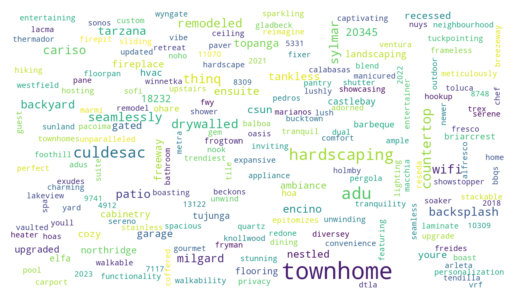

ALL_ALL_group_2 @ threshold 5%


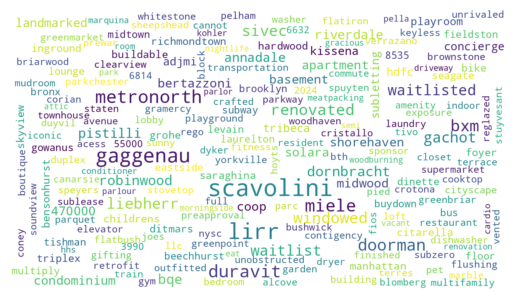

Word Clouds:  17%|█▋        | 1/6 [00:15<01:19, 15.82s/it]

ALL_ALL_group_0: 0 to 13 Days
ALL_ALL_group_1: 13 to 192 Days
ALL_ALL_group_2: 192 to 365 Days
ALL_ALL_group_0 @ threshold 10%


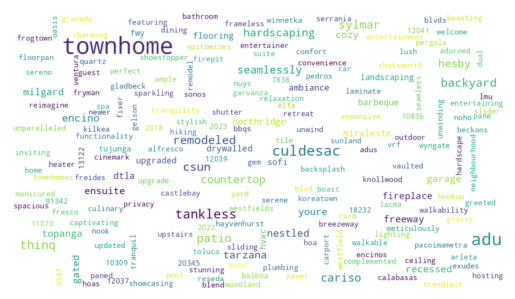

ALL_ALL_group_2 @ threshold 10%


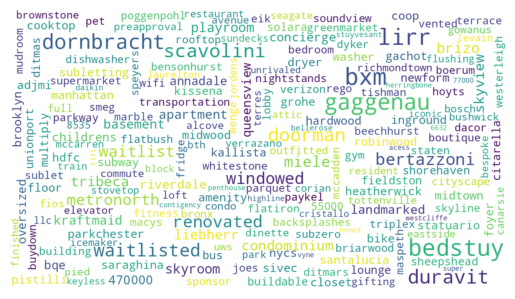

Word Clouds:  33%|███▎      | 2/6 [00:27<00:52, 13.20s/it]

ALL_ALL_group_0: 0 to 23 Days
ALL_ALL_group_1: 23 to 155 Days
ALL_ALL_group_2: 155 to 365 Days
ALL_ALL_group_0 @ threshold 15%


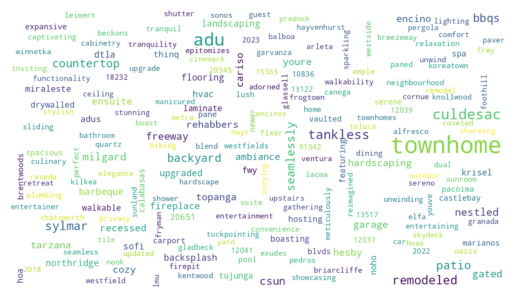

ALL_ALL_group_2 @ threshold 15%


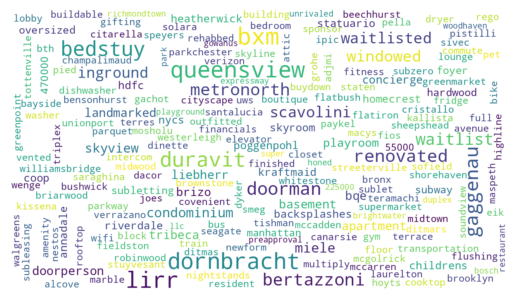

Word Clouds:  50%|█████     | 3/6 [00:38<00:36, 12.15s/it]

ALL_ALL_group_0: 0 to 30 Days
ALL_ALL_group_1: 30 to 127 Days
ALL_ALL_group_2: 127 to 365 Days
ALL_ALL_group_0 @ threshold 20%


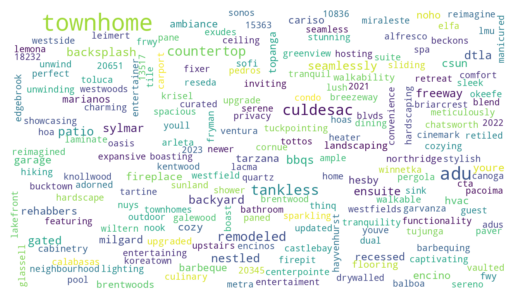

ALL_ALL_group_2 @ threshold 20%


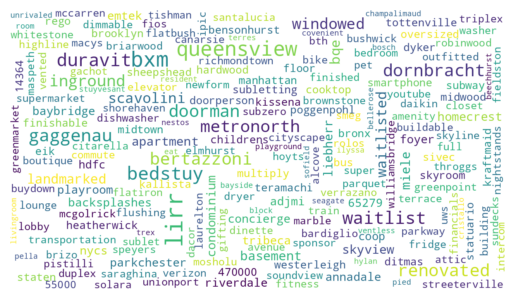

Word Clouds:  67%|██████▋   | 4/6 [00:47<00:22, 11.21s/it]

ALL_ALL_group_0: 0 to 35 Days
ALL_ALL_group_1: 35 to 110 Days
ALL_ALL_group_2: 110 to 365 Days
ALL_ALL_group_0 @ threshold 25%


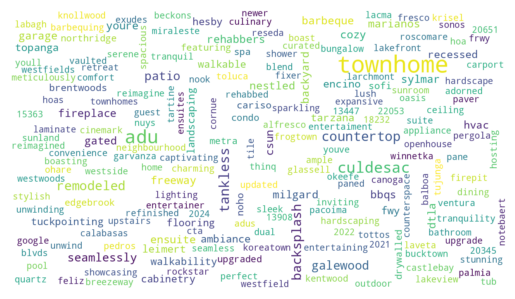

ALL_ALL_group_2 @ threshold 25%


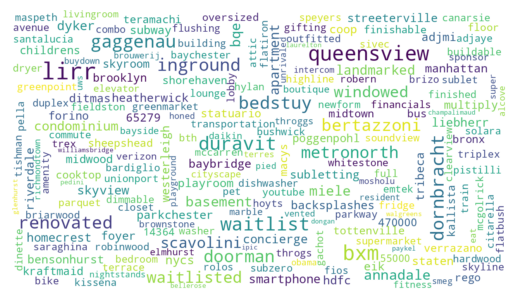

Word Clouds:  83%|████████▎ | 5/6 [00:59<00:11, 11.52s/it]

ALL_ALL_group_0: 0 to 40 Days
ALL_ALL_group_1: 40 to 97 Days
ALL_ALL_group_2: 97 to 365 Days
ALL_ALL_group_0 @ threshold 30%


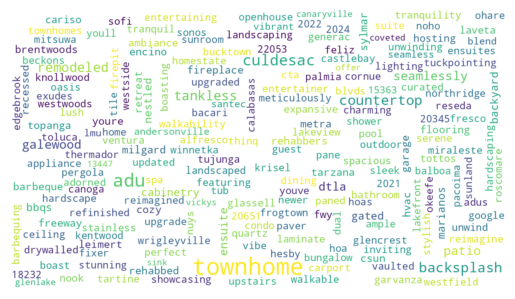

ALL_ALL_group_2 @ threshold 30%


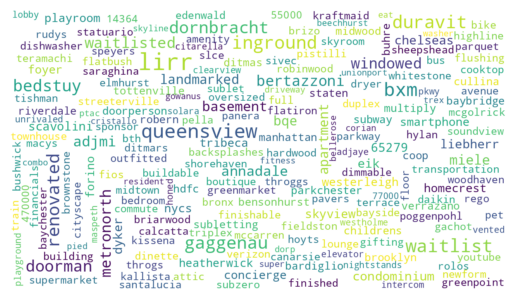

Word Clouds: 100%|██████████| 6/6 [01:11<00:00, 11.91s/it]


In [ ]:
from tqdm import tqdm

cities = ['ALL']
single_types = ['ALL']
output_dir = "./dataset/word_counts"


for a in tqdm([0.05, 0.10, 0.15, 0.20, 0.25, 0.30], desc="Word Clouds"):
    percentages = [a, 1-2*a, a]

    for city in cities:
        for single in single_types:
            city_single_df = zillow_tokenized_df.copy()
            process_and_save_word_counts(city_single_df, city, single, percentages, output_dir)

    for city in cities:
        for single in single_types:
                counts_i_name = f"{city}_{single}_group_0" # lower
                counts_i = read_word_count_file(f'./dataset/word_counts/{counts_i_name}_counts.csv')
                counts_i_dict = {k: v for k, v in counts_i.items() if k in global_counts}
                counts_j_name = f"{city}_{single}_group_2" # upper
                counts_j = read_word_count_file(f'./dataset/word_counts/{counts_j_name}_counts.csv')
                counts_j_dict = {k: v for k, v in counts_j.items() if k in global_counts}
                top_words_df = calculate_log_odds_idp(global_counts, counts_i_name, counts_i_dict, counts_j_name, counts_j_dict)
                find_discriminative_words(top_words_df, threshold_i=2, threshold_j=2, num_i=250, num_j=250, mypath='./dataset', percent=a)

    for city in cities:
        for single in single_types:
            for level in ['group_0', 'group_2']:
                group_name = f"{city}_{single}_{level}"
                print(f"{group_name} @ threshold {int(100*a)}%")
                fullTermsDict = read_word_count_file(f'./dataset/word_counts/{a}/{group_name}_zscore.csv')
                outputfile = f"./image/{group_name}_{a}"
                makeImage(fullTermsDict, outputfile)

Word Clouds:   0%|          | 0/6 [00:00<?, ?it/s]

CH_0_group_0: 0 to 22 Days
CH_0_group_1: 22 to 167 Days
CH_0_group_2: 167 to 350 Days
CH_1_group_0: 0 to 20 Days
CH_1_group_1: 20 to 150 Days
CH_1_group_2: 152 to 345 Days
NY_0_group_0: 0 to 55 Days
NY_0_group_1: 55 to 269 Days
NY_0_group_2: 270 to 360 Days
NY_1_group_0: 0 to 56 Days
NY_1_group_1: 56 to 280 Days
NY_1_group_2: 280 to 365 Days
LA_0_group_0: 0 to 2 Days
LA_0_group_1: 2 to 125 Days
LA_0_group_2: 125 to 343 Days
LA_1_group_0: 0 to 5 Days
LA_1_group_1: 5 to 155 Days
LA_1_group_2: 155 to 353 Days
CH_0_group_0 @ threshold 5%


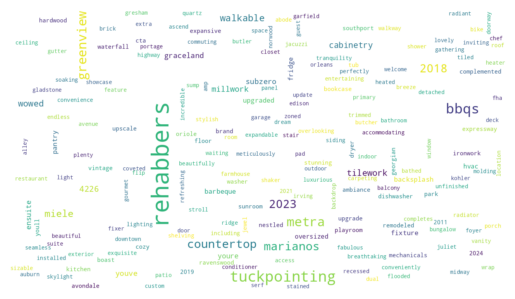

CH_0_group_2 @ threshold 5%


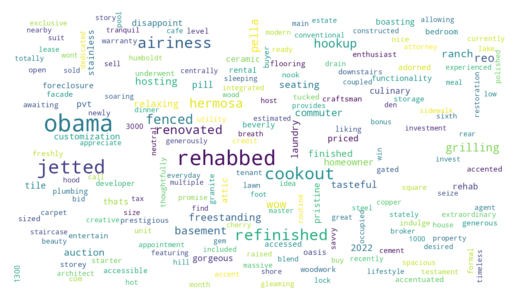

CH_1_group_0 @ threshold 5%


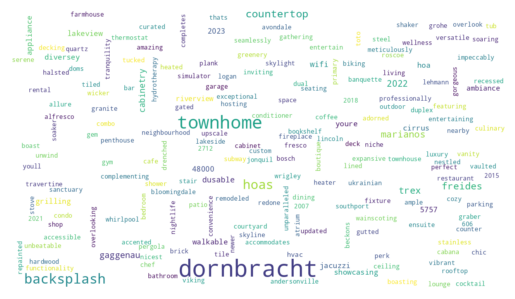

CH_1_group_2 @ threshold 5%


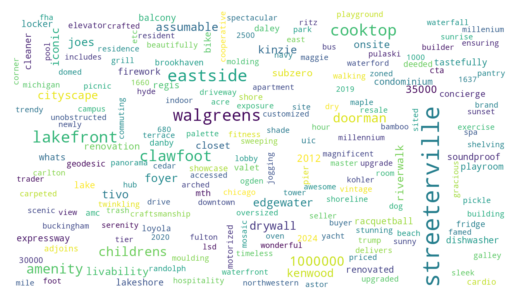

NY_0_group_0 @ threshold 5%


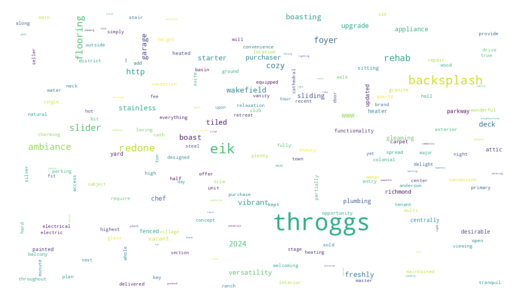

NY_0_group_2 @ threshold 5%


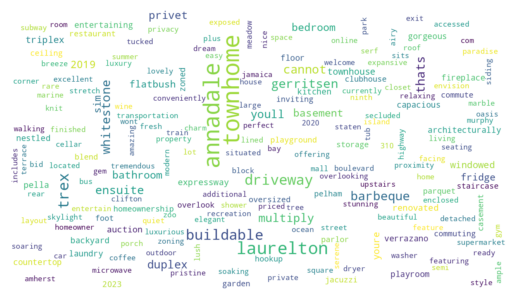

NY_1_group_0 @ threshold 5%


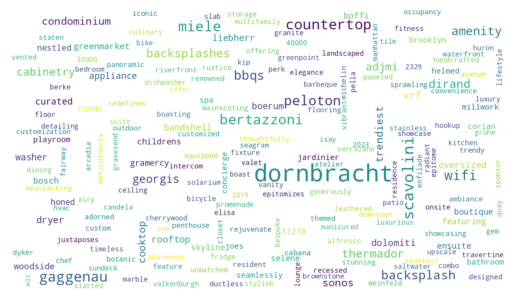

NY_1_group_2 @ threshold 5%


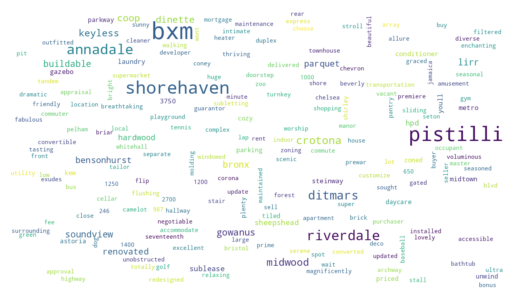

LA_0_group_0 @ threshold 5%


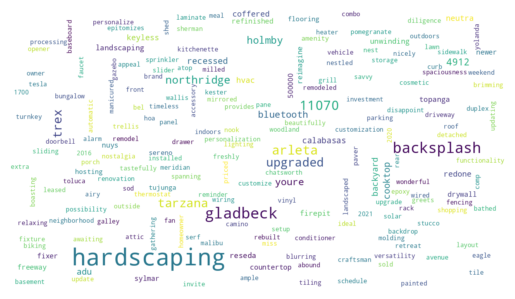

LA_0_group_2 @ threshold 5%


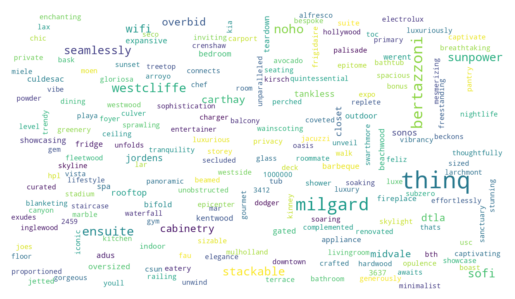

LA_1_group_0 @ threshold 5%


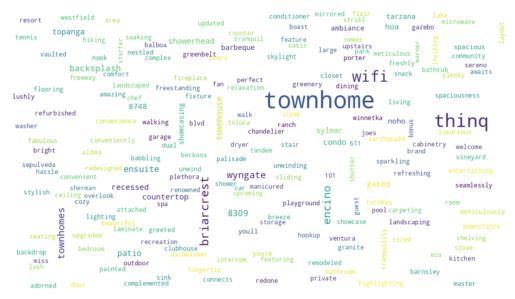

LA_1_group_2 @ threshold 5%


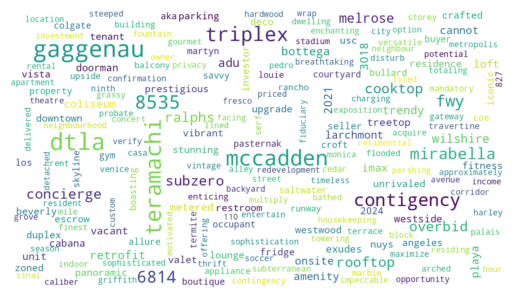

Word Clouds:  17%|█▋        | 1/6 [01:05<05:27, 65.57s/it]

CH_0_group_0: 0 to 29 Days
CH_0_group_1: 29 to 126 Days
CH_0_group_2: 127 to 350 Days
CH_1_group_0: 0 to 27 Days
CH_1_group_1: 27 to 110 Days
CH_1_group_2: 110 to 345 Days
NY_0_group_0: 0 to 65 Days
NY_0_group_1: 65 to 238 Days
NY_0_group_2: 238 to 360 Days
NY_1_group_0: 0 to 71 Days
NY_1_group_1: 72 to 249 Days
NY_1_group_2: 249 to 365 Days
LA_0_group_0: 0 to 5 Days
LA_0_group_1: 5 to 91 Days
LA_0_group_2: 91 to 343 Days
LA_1_group_0: 0 to 8 Days
LA_1_group_1: 8 to 112 Days
LA_1_group_2: 112 to 353 Days
CH_0_group_0 @ threshold 10%


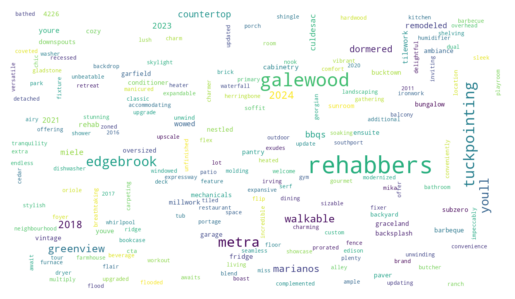

CH_0_group_2 @ threshold 10%


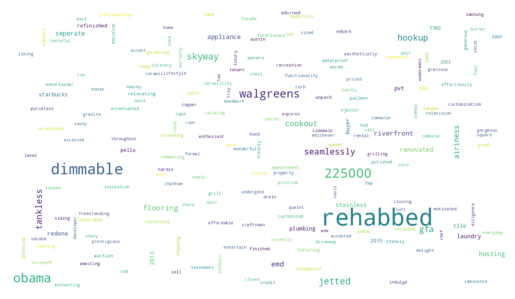

CH_1_group_0 @ threshold 10%


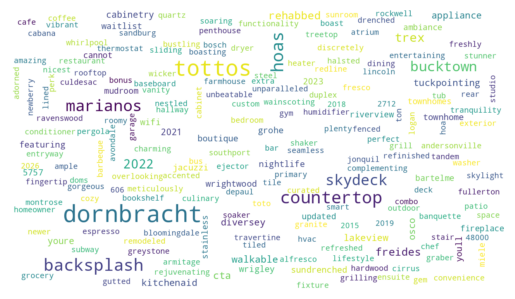

CH_1_group_2 @ threshold 10%


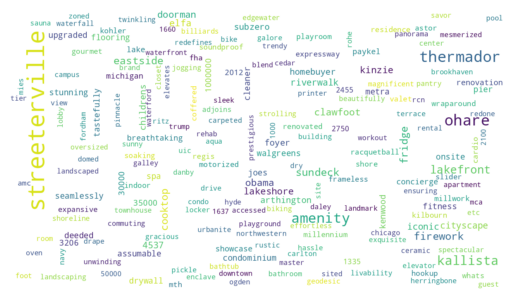

NY_0_group_0 @ threshold 10%


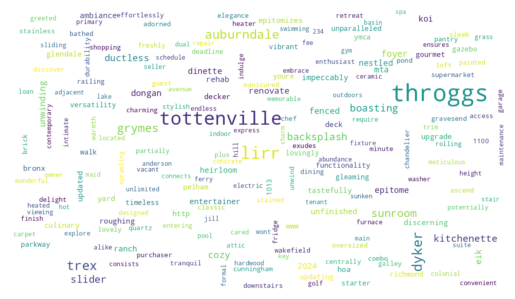

NY_0_group_2 @ threshold 10%


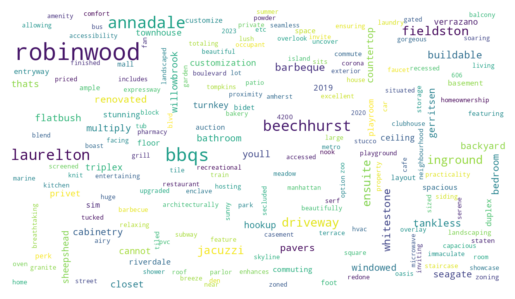

NY_1_group_0 @ threshold 10%


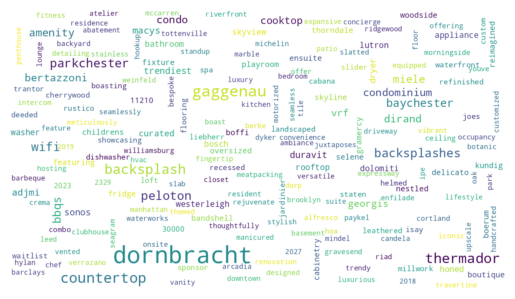

NY_1_group_2 @ threshold 10%


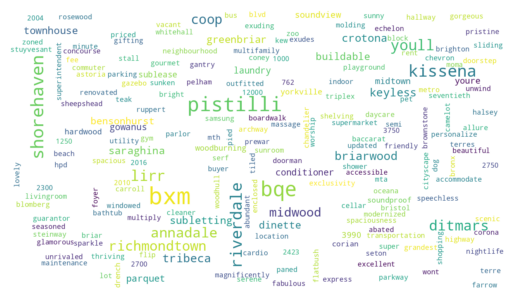

LA_0_group_0 @ threshold 10%


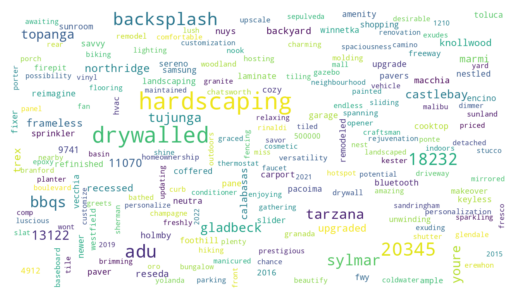

LA_0_group_2 @ threshold 10%


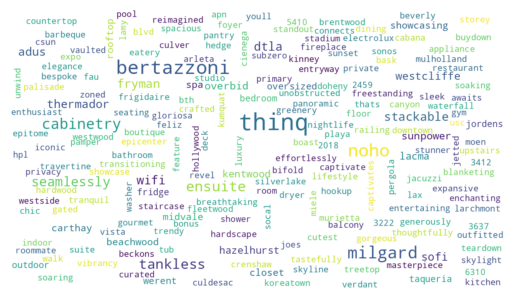

LA_1_group_0 @ threshold 10%


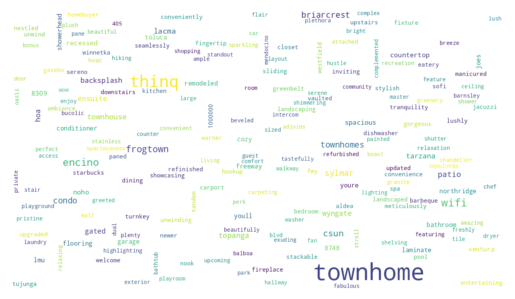

LA_1_group_2 @ threshold 10%


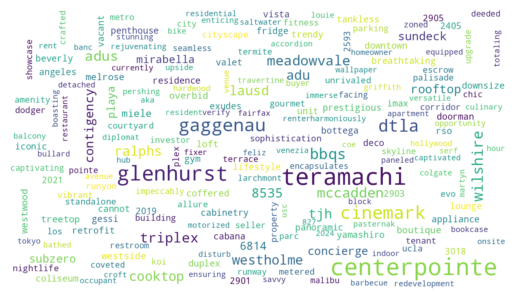

Word Clouds:  33%|███▎      | 2/6 [02:09<04:17, 64.39s/it]

CH_0_group_0: 0 to 32 Days
CH_0_group_1: 32 to 104 Days
CH_0_group_2: 104 to 350 Days
CH_1_group_0: 0 to 31 Days
CH_1_group_1: 31 to 91 Days
CH_1_group_2: 92 to 345 Days
NY_0_group_0: 0 to 70 Days
NY_0_group_1: 70 to 215 Days
NY_0_group_2: 216 to 360 Days
NY_1_group_0: 0 to 81 Days
NY_1_group_1: 81 to 235 Days
NY_1_group_2: 235 to 365 Days
LA_0_group_0: 0 to 7 Days
LA_0_group_1: 7 to 76 Days
LA_0_group_2: 76 to 343 Days
LA_1_group_0: 0 to 10 Days
LA_1_group_1: 10 to 92 Days
LA_1_group_2: 92 to 353 Days
CH_0_group_0 @ threshold 15%


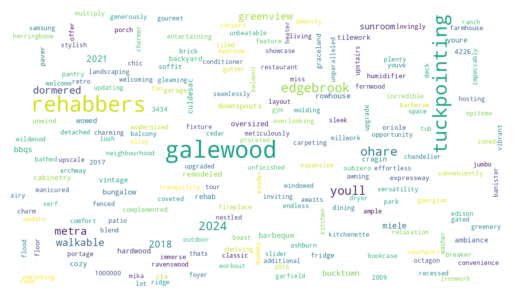

CH_0_group_2 @ threshold 15%


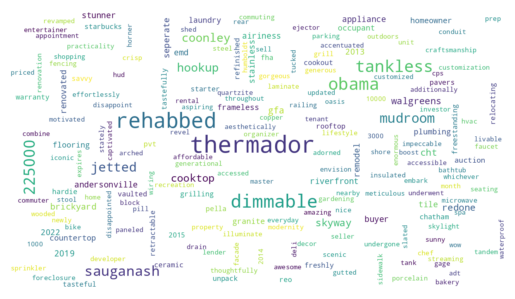

CH_1_group_0 @ threshold 15%


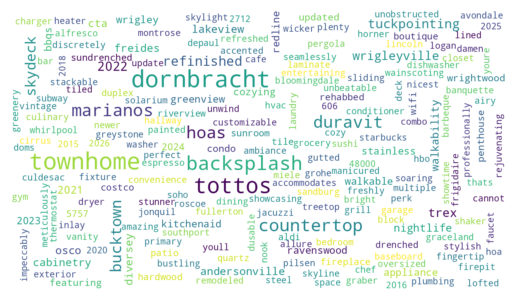

CH_1_group_2 @ threshold 15%


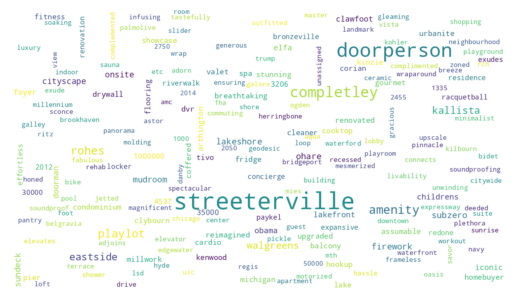

NY_0_group_0 @ threshold 15%


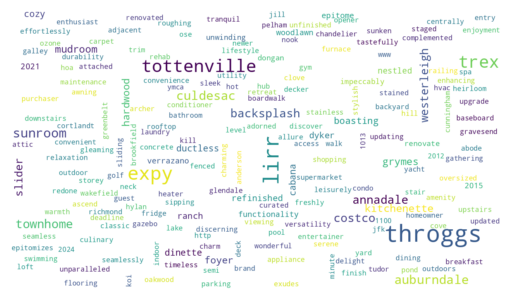

NY_0_group_2 @ threshold 15%


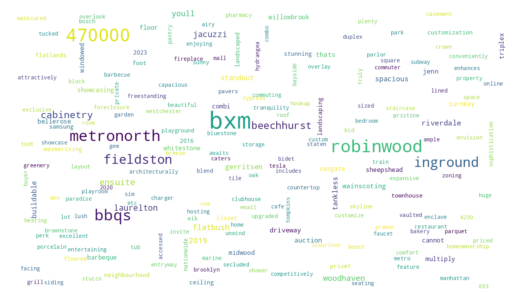

NY_1_group_0 @ threshold 15%


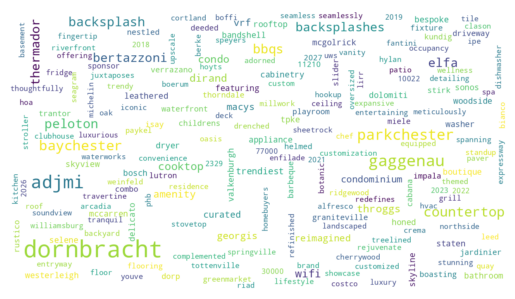

NY_1_group_2 @ threshold 15%


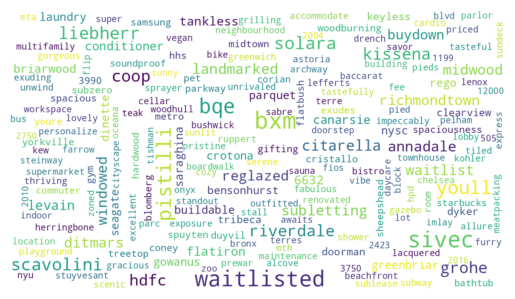

LA_0_group_0 @ threshold 15%


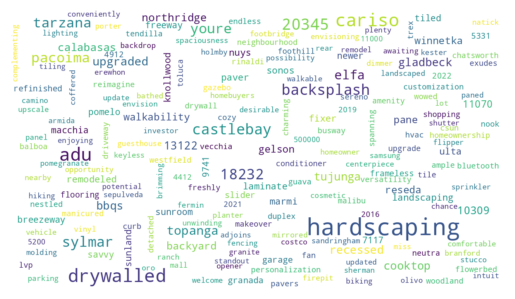

LA_0_group_2 @ threshold 15%


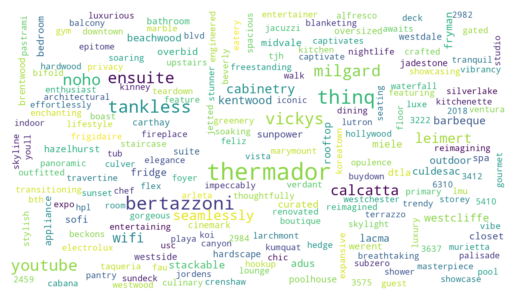

LA_1_group_0 @ threshold 15%


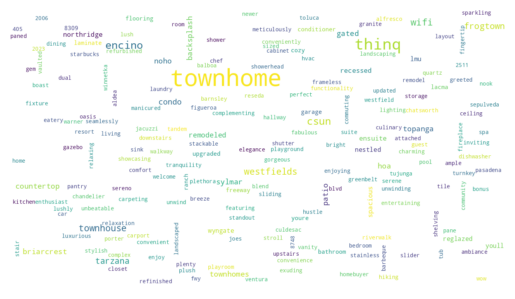

LA_1_group_2 @ threshold 15%


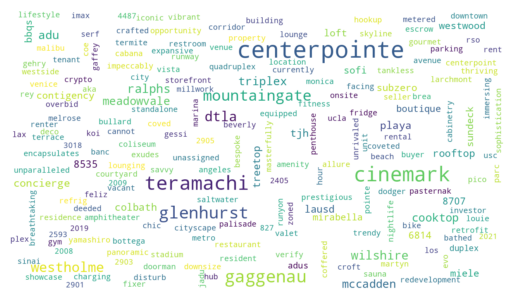

Word Clouds:  50%|█████     | 3/6 [03:13<03:12, 64.26s/it]

CH_0_group_0: 0 to 35 Days
CH_0_group_1: 35 to 87 Days
CH_0_group_2: 87 to 350 Days
CH_1_group_0: 0 to 35 Days
CH_1_group_1: 35 to 81 Days
CH_1_group_2: 81 to 345 Days
NY_0_group_0: 0 to 76 Days
NY_0_group_1: 77 to 192 Days
NY_0_group_2: 192 to 360 Days
NY_1_group_0: 0 to 91 Days
NY_1_group_1: 91 to 222 Days
NY_1_group_2: 222 to 365 Days
LA_0_group_0: 0 to 9 Days
LA_0_group_1: 9 to 64 Days
LA_0_group_2: 64 to 343 Days
LA_1_group_0: 0 to 15 Days
LA_1_group_1: 15 to 81 Days
LA_1_group_2: 81 to 353 Days
CH_0_group_0 @ threshold 20%


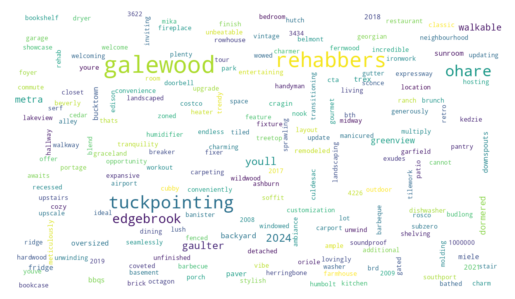

CH_0_group_2 @ threshold 20%


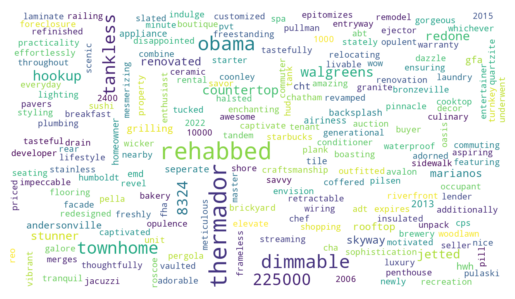

CH_1_group_0 @ threshold 20%


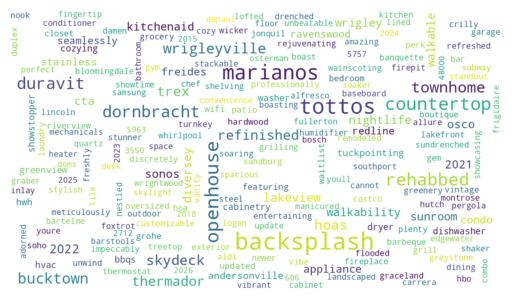

CH_1_group_2 @ threshold 20%


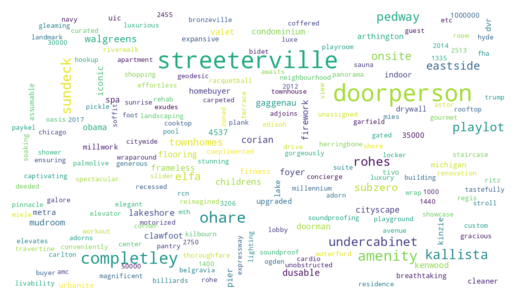

NY_0_group_0 @ threshold 20%


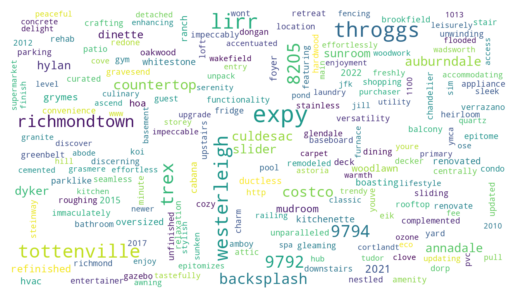

NY_0_group_2 @ threshold 20%


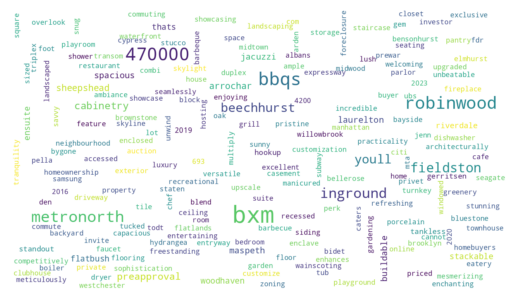

NY_1_group_0 @ threshold 20%


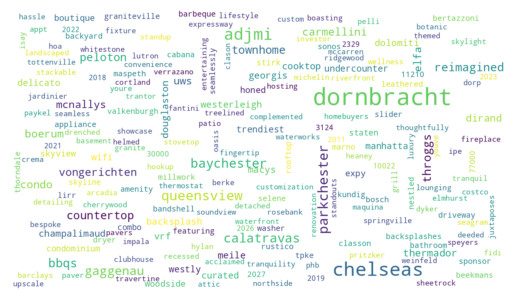

NY_1_group_2 @ threshold 20%


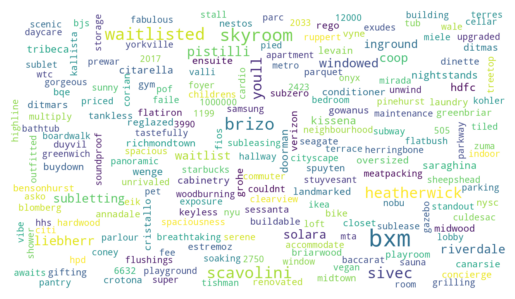

LA_0_group_0 @ threshold 20%


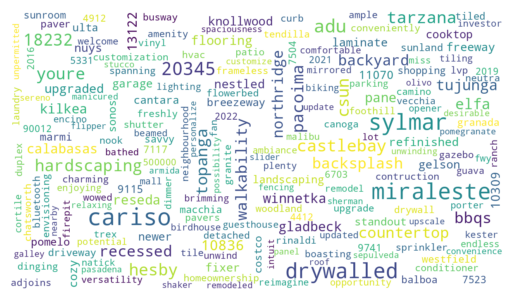

LA_0_group_2 @ threshold 20%


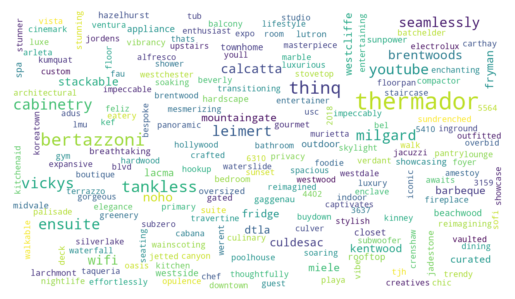

LA_1_group_0 @ threshold 20%


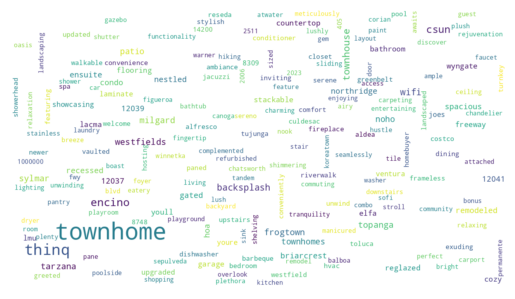

LA_1_group_2 @ threshold 20%


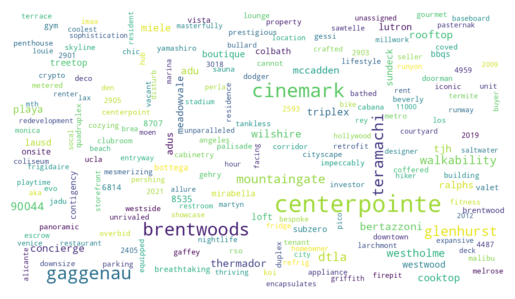

Word Clouds:  67%|██████▋   | 4/6 [04:22<02:12, 66.07s/it]

CH_0_group_0: 0 to 37 Days
CH_0_group_1: 37 to 77 Days
CH_0_group_2: 77 to 350 Days
CH_1_group_0: 0 to 37 Days
CH_1_group_1: 37 to 74 Days
CH_1_group_2: 74 to 345 Days
NY_0_group_0: 0 to 83 Days
NY_0_group_1: 83 to 168 Days
NY_0_group_2: 168 to 360 Days
NY_1_group_0: 0 to 97 Days
NY_1_group_1: 97 to 212 Days
NY_1_group_2: 212 to 365 Days
LA_0_group_0: 0 to 12 Days
LA_0_group_1: 12 to 56 Days
LA_0_group_2: 56 to 343 Days
LA_1_group_0: 0 to 21 Days
LA_1_group_1: 21 to 73 Days
LA_1_group_2: 73 to 353 Days
CH_0_group_0 @ threshold 25%


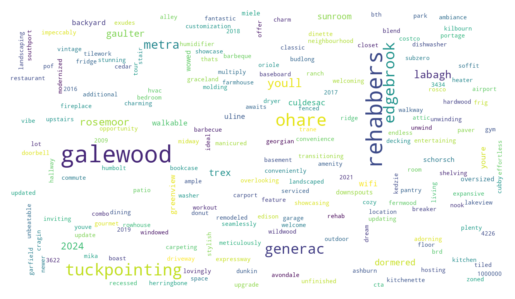

CH_0_group_2 @ threshold 25%


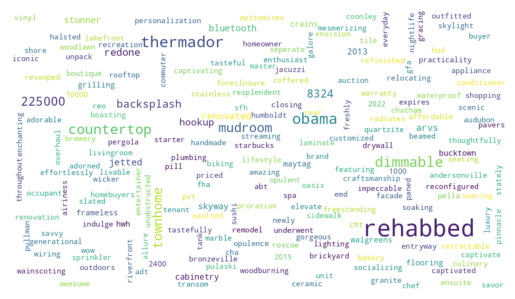

CH_1_group_0 @ threshold 25%


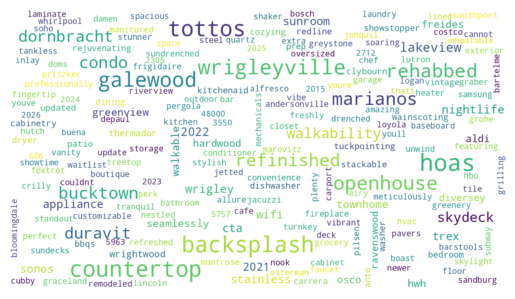

CH_1_group_2 @ threshold 25%


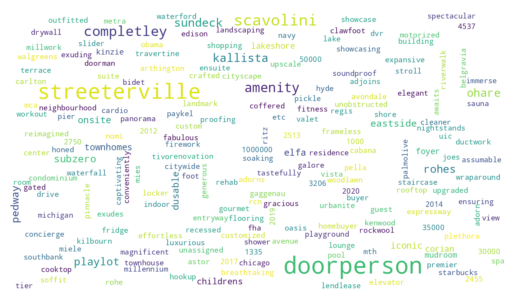

NY_0_group_0 @ threshold 25%


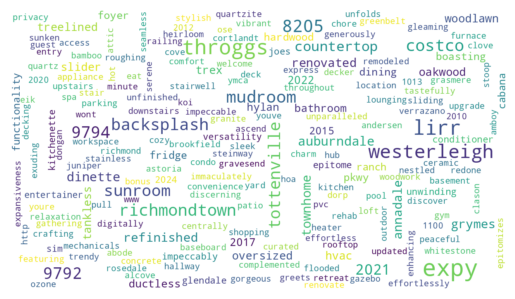

NY_0_group_2 @ threshold 25%


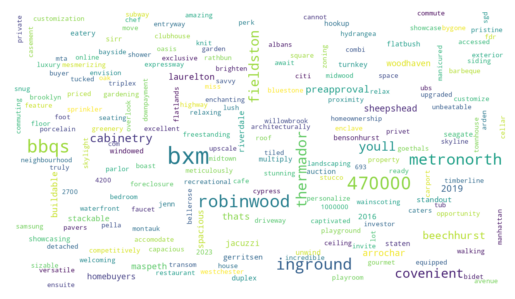

NY_1_group_0 @ threshold 25%


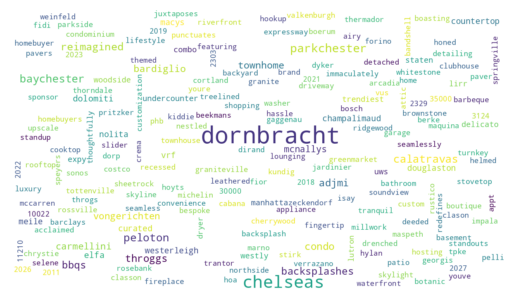

NY_1_group_2 @ threshold 25%


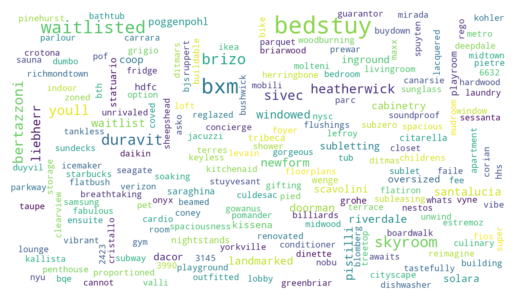

LA_0_group_0 @ threshold 25%


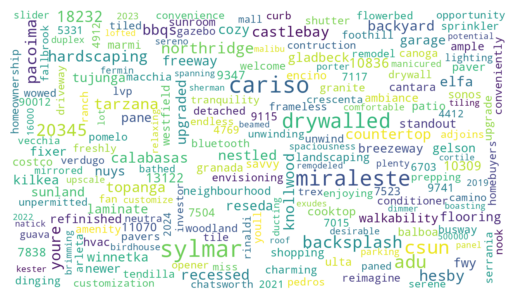

LA_0_group_2 @ threshold 25%


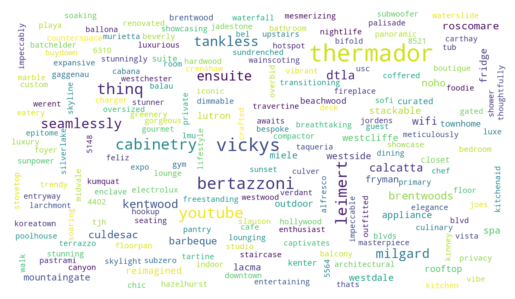

LA_1_group_0 @ threshold 25%


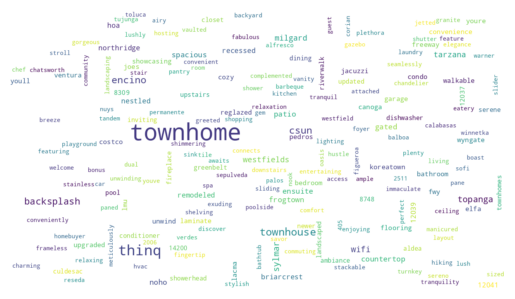

LA_1_group_2 @ threshold 25%


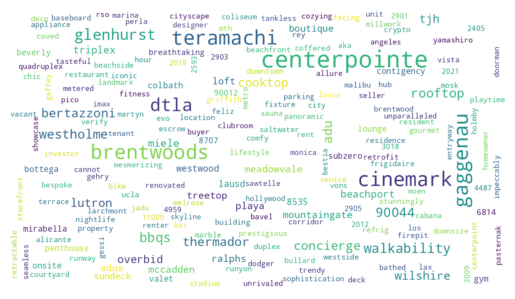

Word Clouds:  83%|████████▎ | 5/6 [05:26<01:05, 65.48s/it]

CH_0_group_0: 0 to 41 Days
CH_0_group_1: 41 to 69 Days
CH_0_group_2: 69 to 350 Days
CH_1_group_0: 0 to 41 Days
CH_1_group_1: 41 to 68 Days
CH_1_group_2: 68 to 345 Days
NY_0_group_0: 0 to 89 Days
NY_0_group_1: 89 to 150 Days
NY_0_group_2: 151 to 360 Days
NY_1_group_0: 0 to 104 Days
NY_1_group_1: 104 to 194 Days
NY_1_group_2: 194 to 365 Days
LA_0_group_0: 0 to 16 Days
LA_0_group_1: 16 to 50 Days
LA_0_group_2: 50 to 343 Days
LA_1_group_0: 0 to 27 Days
LA_1_group_1: 27 to 63 Days
LA_1_group_2: 63 to 353 Days
CH_0_group_0 @ threshold 30%


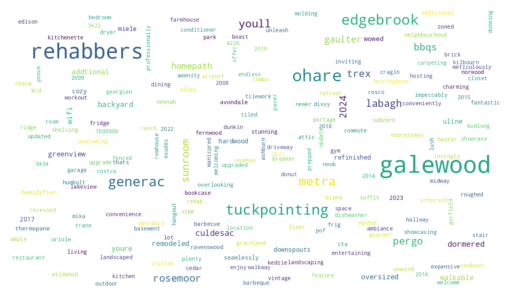

CH_0_group_2 @ threshold 30%


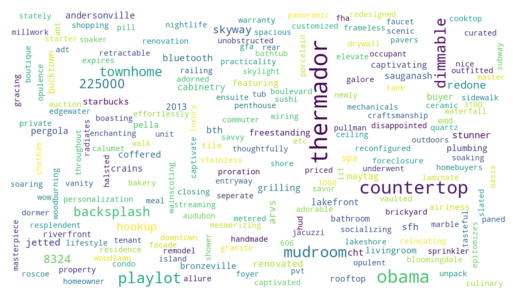

CH_1_group_0 @ threshold 30%


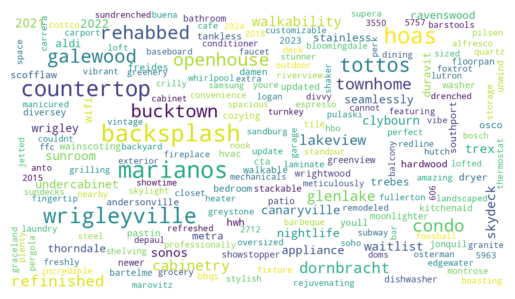

CH_1_group_2 @ threshold 30%


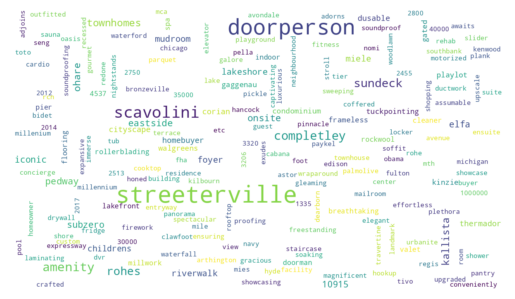

NY_0_group_0 @ threshold 30%


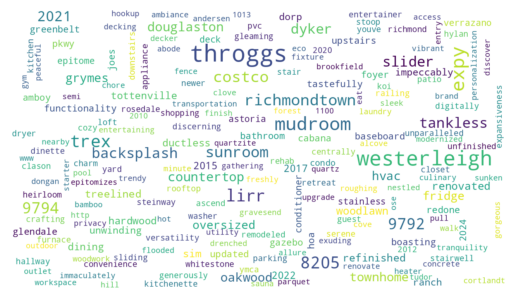

NY_0_group_2 @ threshold 30%


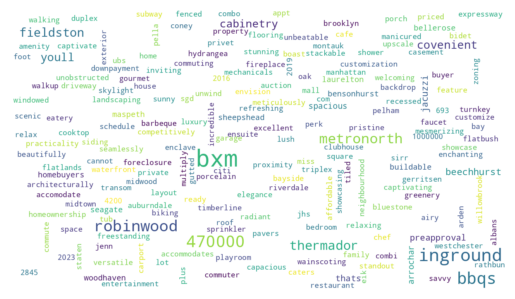

NY_1_group_0 @ threshold 30%


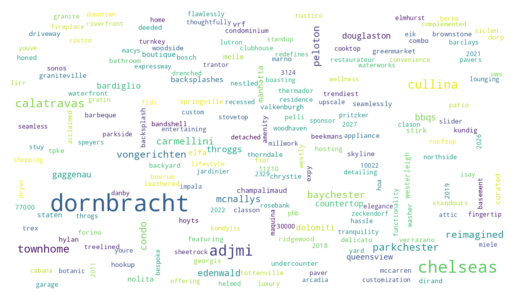

NY_1_group_2 @ threshold 30%


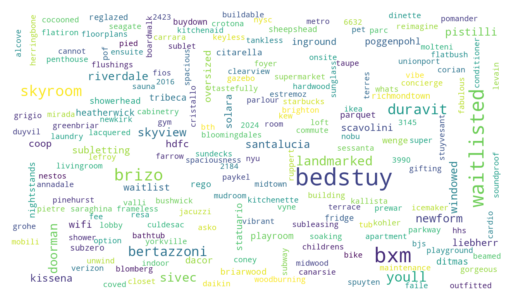

LA_0_group_0 @ threshold 30%


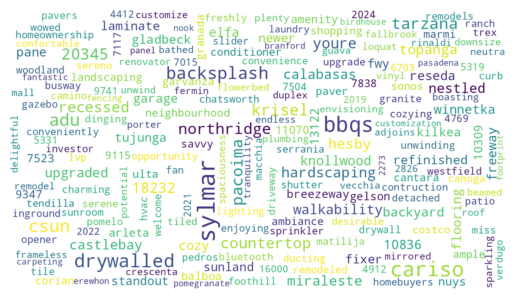

LA_0_group_2 @ threshold 30%


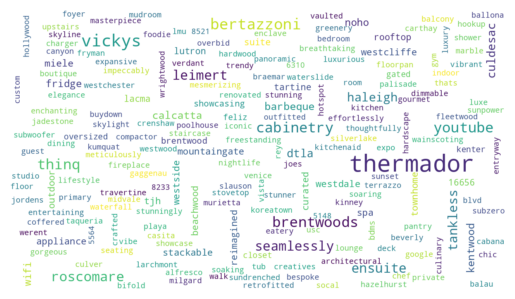

LA_1_group_0 @ threshold 30%


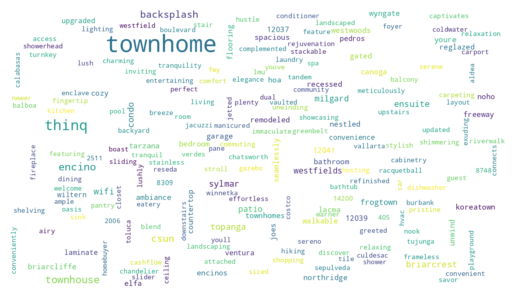

LA_1_group_2 @ threshold 30%


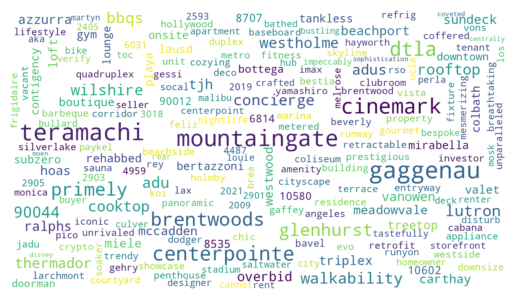

Word Clouds: 100%|██████████| 6/6 [06:38<00:00, 66.36s/it]


In [ ]:
from tqdm import tqdm

cities = ['CH', 'NY', 'LA']
single_types = [0, 1]
output_dir = "./dataset/word_counts"


for a in tqdm([0.05, 0.10, 0.15, 0.20, 0.25, 0.30], desc="Word Clouds"):
    percentages = [a, 1-2*a, a]

    for city in cities:
        for single in single_types:
            city_single_df = zillow_tokenized_df[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single)]
            process_and_save_word_counts(city_single_df, city, single, percentages, output_dir)

    for city in cities:
        for single in single_types:
                counts_i_name = f"{city}_{single}_group_0" # lower
                counts_i = read_word_count_file(f'./dataset/word_counts/{counts_i_name}_counts.csv')
                counts_i_dict = {k: v for k, v in counts_i.items() if k in global_counts}
                counts_j_name = f"{city}_{single}_group_2" # upper
                counts_j = read_word_count_file(f'./dataset/word_counts/{counts_j_name}_counts.csv')
                counts_j_dict = {k: v for k, v in counts_j.items() if k in global_counts}
                top_words_df = calculate_log_odds_idp(global_counts, counts_i_name, counts_i_dict, counts_j_name, counts_j_dict)
                find_discriminative_words(top_words_df, threshold_i=2, threshold_j=2, num_i=250, num_j=250, mypath='./dataset', percent=a)

    for city in cities:
        for single in single_types:
            for level in ['group_0', 'group_2']:
                group_name = f"{city}_{single}_{level}"
                print(f"{group_name} @ threshold {int(100*a)}%")
                fullTermsDict = read_word_count_file(f'./dataset/word_counts/{a}/{group_name}_zscore.csv')
                outputfile = f"./image/{group_name}_{a}"
                makeImage(fullTermsDict, outputfile)

## Threshold

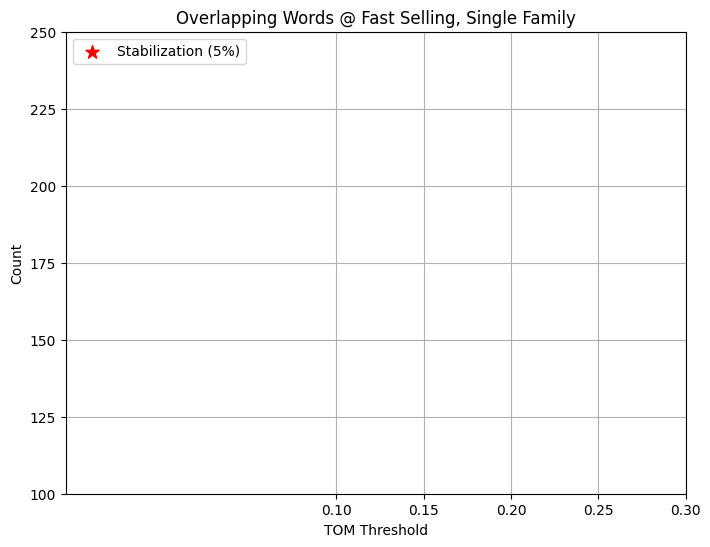

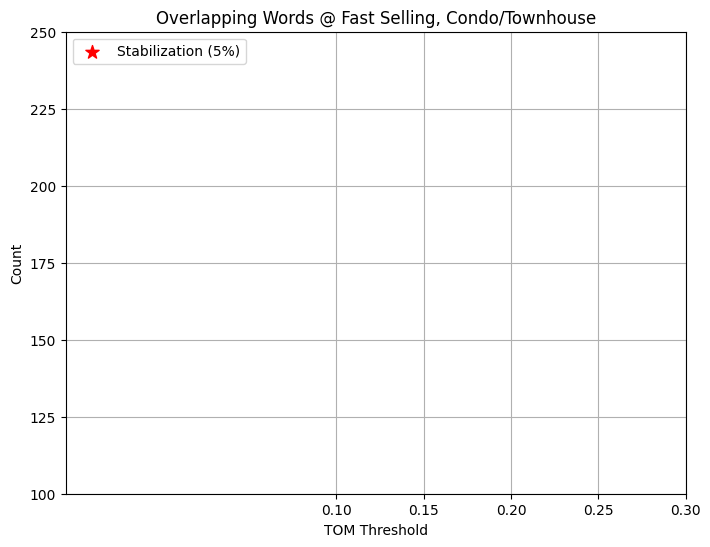

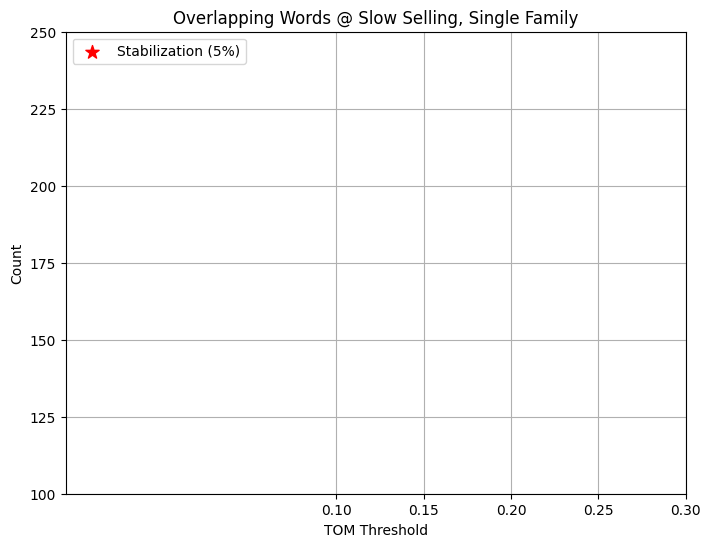

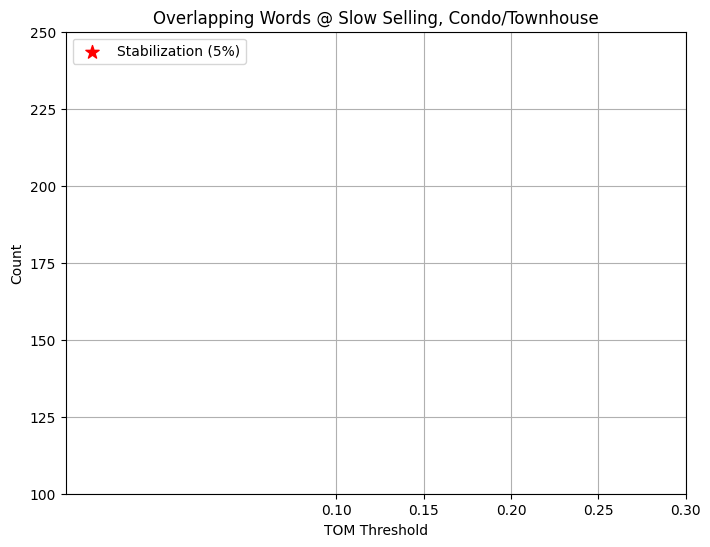

In [ ]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt

# Define the parameters
cities = ['ALL']
singles = ['ALL']
groups = [0, 2]
a_values = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30]

# Generate all combinations of city, single, and group
combinations = list(itertools.product(cities, singles, groups))

# Initialize a dictionary to store word sets for each combination
word_sets_by_combination = {}

# Iterate through each combination
for city, single, group in combinations:
    word_sets = []
    for a in a_values:
        file_name = f"{city}_{single}_group_{group}"
        file_path = f"dataset/word_counts/{a}/{file_name}_zscore.csv"

        # Read the CSV file
        try:
            table = pd.read_csv(file_path, header=None, names=['word', 'z'])
            word_set = set(table['word'])
            word_sets.append(word_set)
        except FileNotFoundError:
            word_sets.append(set())

    # Store the word sets for this combination
    word_sets_by_combination[(city, single, group)] = word_sets

# Initialize a dictionary to store overlap counts for each combination
overlap_counts_by_combination = {}

# Calculate overlaps for each combination
for combination, word_sets in word_sets_by_combination.items():
    overlap_counts = []
    for i in range(1, len(word_sets)):
        overlap_count = len(word_sets[i] & word_sets[i-1])
        overlap_counts.append(overlap_count)

    # Store the overlap counts for this combination
    overlap_counts_by_combination[combination] = overlap_counts

# Calculate stabilization points based on a less conservative change rate (5%)
stabilization_points_by_combination = {}
for combination ,overlap_counts in overlap_counts_by_combination.items():
    stabilization_point = None
    for i in range(1,len(overlap_counts)):
        if overlap_counts[i-1] ==0:
            continue
        change_rate = abs(overlap_counts[i] - overlap_counts[i-1]) / overlap_counts[i-1]
        if change_rate <0.05:
            stabilization_point = a_values[i]
            break
    stabilization_points_by_combination[combination] = stabilization_point

# Visualization function for overlap counts with stabilization points
def plot_overlap_counts_with_stabilization(group, single):
    plt.figure(figsize=(8, 6))
    shown_stab_point = False
    for (city_single), overlap_counts in overlap_counts_by_combination.items():
        city, single_type, grp = city_single
        if grp == group and single_type == single:
            city_full = "Chicago" if city == "CH" else "New York" if city == "NY" else "Los Angeles" if city == "LA" else "ALL"
            label = f"{city_full}"
            plt.plot(a_values[1:], overlap_counts[:len(a_values[1:])], marker='o', label=label)

            # Plot stabilization point if it exists
            stab_point = stabilization_points_by_combination[(city, single_type, grp)]
            if stab_point is not None and stab_point in a_values[1:]:
                idx = a_values.index(stab_point)
                plt.scatter(a_values[idx], overlap_counts[idx-1], color='red', marker='*', s=150, zorder=5)

    # Add stabilization point to legend last
    plt.scatter([], [], color='red', marker='*', s=100, label='Stabilization (5%)')

    title_group = "Fast Selling" if group == 0 else "Slow Selling"
    title_single = "Single Family" if single == 0 else "Condo/Townhouse"
    plt.title(f'Overlapping Words @ {title_group}, {title_single}')
    plt.xlabel('TOM Threshold')
    plt.ylabel('Count')
    plt.xticks(a_values[1:])
    plt.yticks(range(100, 251, 25))
    plt.ylim(100, 250)
    plt.legend(loc='upper left')  # Set legend position to upper left
    plt.grid(True)
    plt.show()

# Plot for fast selling properties (group=0) and single family (single=0)
plot_overlap_counts_with_stabilization(0, 0)

# Plot for fast selling properties (group=0) and condo/townhouse (single=1)
plot_overlap_counts_with_stabilization(0, 1)

# Plot for slow selling properties (group=2) and single family (single=0)
plot_overlap_counts_with_stabilization(2, 0)

# Plot for slow selling properties (group=2) and condo/townhouse (single=1)
plot_overlap_counts_with_stabilization(2, 1)



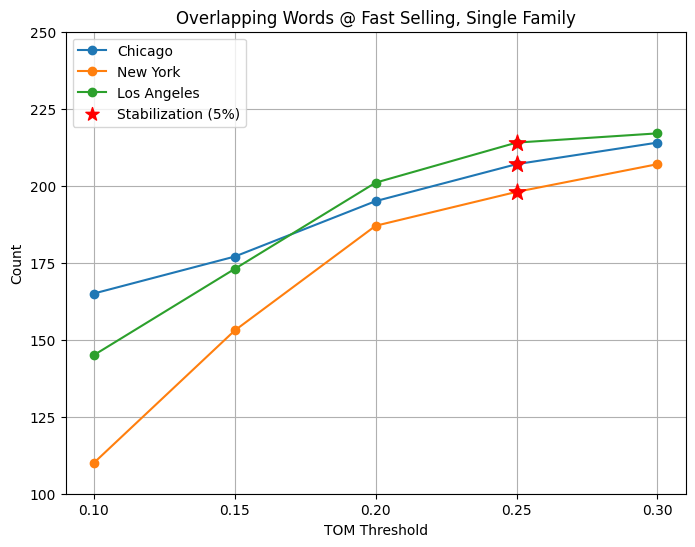

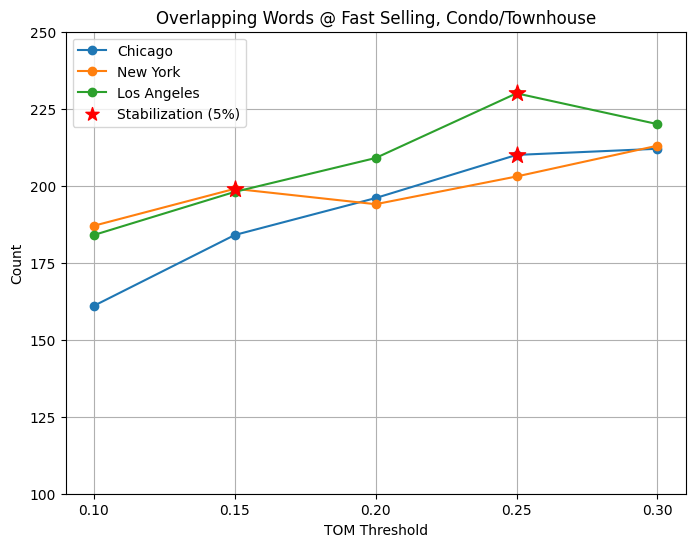

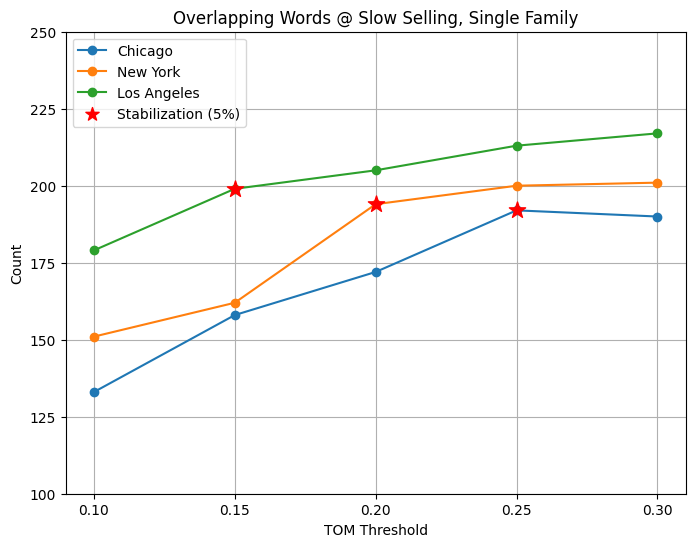

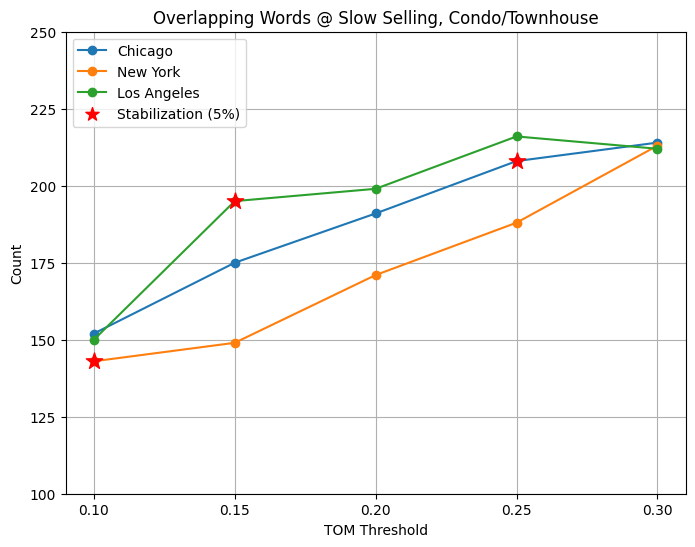

In [ ]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt

# Define the parameters
cities = ['CH', 'NY', 'LA']
singles = [0, 1]
groups = [0, 2]
a_values = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30]

# Generate all combinations of city, single, and group
combinations = list(itertools.product(cities, singles, groups))

# Initialize a dictionary to store word sets for each combination
word_sets_by_combination = {}

# Iterate through each combination
for city, single, group in combinations:
    word_sets = []
    for a in a_values:
        file_name = f"{city}_{single}_group_{group}"
        file_path = f"dataset/word_counts/{a}/{file_name}_zscore.csv"

        # Read the CSV file
        try:
            table = pd.read_csv(file_path, header=None, names=['word', 'z'])
            word_set = set(table['word'])
            word_sets.append(word_set)
        except FileNotFoundError:
            word_sets.append(set())

    # Store the word sets for this combination
    word_sets_by_combination[(city, single, group)] = word_sets

# Initialize a dictionary to store overlap counts for each combination
overlap_counts_by_combination = {}

# Calculate overlaps for each combination
for combination, word_sets in word_sets_by_combination.items():
    overlap_counts = []
    for i in range(1, len(word_sets)):
        overlap_count = len(word_sets[i] & word_sets[i-1])
        overlap_counts.append(overlap_count)

    # Store the overlap counts for this combination
    overlap_counts_by_combination[combination] = overlap_counts

# Calculate stabilization points based on a less conservative change rate (5%)
stabilization_points_by_combination = {}
for combination ,overlap_counts in overlap_counts_by_combination.items():
    stabilization_point = None
    for i in range(1,len(overlap_counts)):
        if overlap_counts[i-1] ==0:
            continue
        change_rate = abs(overlap_counts[i] - overlap_counts[i-1]) / overlap_counts[i-1]
        if change_rate <0.05:
            stabilization_point = a_values[i]
            break
    stabilization_points_by_combination[combination] = stabilization_point

# Visualization function for overlap counts with stabilization points
def plot_overlap_counts_with_stabilization(group, single):
    plt.figure(figsize=(8, 6))
    shown_stab_point = False
    for (city_single), overlap_counts in overlap_counts_by_combination.items():
        city, single_type, grp = city_single
        if grp == group and single_type == single:
            city_full = "Chicago" if city == "CH" else "New York" if city == "NY" else "Los Angeles"
            label = f"{city_full}"
            plt.plot(a_values[1:], overlap_counts[:len(a_values[1:])], marker='o', label=label)

            # Plot stabilization point if it exists
            stab_point = stabilization_points_by_combination[(city, single_type, grp)]
            if stab_point is not None and stab_point in a_values[1:]:
                idx = a_values.index(stab_point)
                plt.scatter(a_values[idx], overlap_counts[idx-1], color='red', marker='*', s=150, zorder=5)

    # Add stabilization point to legend last
    plt.scatter([], [], color='red', marker='*', s=100, label='Stabilization (5%)')

    title_group = "Fast Selling" if group == 0 else "Slow Selling"
    title_single = "Single Family" if single == 0 else "Condo/Townhouse"
    plt.title(f'Overlapping Words @ {title_group}, {title_single}')
    plt.xlabel('TOM Threshold')
    plt.ylabel('Count')
    plt.xticks(a_values[1:])
    plt.yticks(range(100, 251, 25))
    plt.ylim(100, 250)
    plt.legend(loc='upper left')  # Set legend position to upper left
    plt.grid(True)
    plt.show()

# Plot for fast selling properties (group=0) and single family (single=0)
plot_overlap_counts_with_stabilization(0, 0)

# Plot for fast selling properties (group=0) and condo/townhouse (single=1)
plot_overlap_counts_with_stabilization(0, 1)

# Plot for slow selling properties (group=2) and single family (single=0)
plot_overlap_counts_with_stabilization(2, 0)

# Plot for slow selling properties (group=2) and condo/townhouse (single=1)
plot_overlap_counts_with_stabilization(2, 1)



In [ ]:
overlap_counts_by_combination

{('CH', 0, 0): [165, 177, 195, 207, 214],
 ('CH', 0, 2): [133, 158, 172, 192, 190],
 ('CH', 1, 0): [161, 184, 196, 210, 212],
 ('CH', 1, 2): [152, 175, 191, 208, 214],
 ('NY', 0, 0): [110, 153, 187, 198, 207],
 ('NY', 0, 2): [151, 162, 194, 200, 201],
 ('NY', 1, 0): [187, 199, 194, 203, 213],
 ('NY', 1, 2): [143, 149, 171, 188, 213],
 ('LA', 0, 0): [145, 173, 201, 214, 217],
 ('LA', 0, 2): [179, 199, 205, 213, 217],
 ('LA', 1, 0): [184, 198, 209, 230, 220],
 ('LA', 1, 2): [150, 195, 199, 216, 212]}

In [ ]:
stabilization_points_by_combination

{('CH', 0, 0): 0.25,
 ('CH', 0, 2): 0.25,
 ('CH', 1, 0): 0.25,
 ('CH', 1, 2): 0.25,
 ('NY', 0, 0): 0.25,
 ('NY', 0, 2): 0.2,
 ('NY', 1, 0): 0.15,
 ('NY', 1, 2): 0.1,
 ('LA', 0, 0): 0.25,
 ('LA', 0, 2): 0.15,
 ('LA', 1, 0): 0.25,
 ('LA', 1, 2): 0.15}

# TF-IDF

In [ ]:
zillow_tokenized_df

,zpid,city,submarket,zipcode,address,price,like,view,duration,day,single,parking,bathroom,bedroom,age,living,description,geometry
0,4171164,CH,South,60617,10905 S Avenue H,309000,0,20,134,64,0,2.5,4.0,4.0,81.0,2376.0,tastefully and professionally updated 4 bedroo...,POINT (-87.53252 41.69706)
1,80851025,CH,South,60616,475 W 24th St APT 5H,265000,0,44,50,7,1,1.0,2.0,2.0,19.0,900.0,experience city living a it finest in this top...,POINT (-87.63969 41.84879)
2,2127908883,CH,West,60612,2827 W Congress Pkwy APT 3,230000,0,7,90,83,1,1.0,2.0,2.0,17.0,1300.0,offering exceptional comfort convenience and e...,POINT (-87.69721 41.87457)
3,60265291,CH,North,60614,2712 N Ashland Ave #4A,460271,0,20,25,64,1,1.0,2.0,2.0,24.0,1700.0,looking for an updated extra wide 2 bedroom 2 ...,POINT (-87.66872 41.93097)
4,3700052,CH,North,60640,5415 N Sheridan Rd APT 306,319000,2,112,37,40,1,1.0,2.0,2.0,51.0,1250.0,discover the allure of this 2 bedroom 2 bathro...,POINT (-87.65439 41.97993)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10106,20383564,LA,West LA,90045,8117 Chase Ave,1811700,4,186,41,7,0,4.0,3.0,4.0,78.0,1892.0,welcome to this impressive westchester home vi...,POINT (-118.41126 33.96461)
10107,20510134,LA,West LA,90067,10128 Empyrean Way APT 302,2100000,0,17,178,79,1,2.0,4.0,2.0,45.0,2498.0,from the foyer enter to a sophisticated living...,POINT (-118.40809 34.05322)
10108,19905411,LA,San Fernando Valley,91335,7428 Vanalden Ave,815000,0,59,5,47,0,2.0,1.0,3.0,72.0,1670.0,major equity opportunity in the city of reseda...,POINT (-118.54884 34.20552)
10109,302794497,LA,West LA,90094,12678 Millennium,3715000,1,140,78,12,0,3.0,5.0,4.0,7.0,3639.0,embrace luxury living and the best in playa vi...,POINT (-118.41388 33.97678)


In [ ]:
# Overall

from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
import pandas as pd

def get_top_words(df, city, single, n=31):
    vectorizer = TfidfVectorizer(stop_words='english')
    city_single_df = df[(df['city'] == city) & (df['single'] == single)]
    tfidf_matrix = vectorizer.fit_transform(city_single_df['description'])
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())
    mean_tfidf = tfidf_df.mean().sort_values(ascending=False)
    top_words = mean_tfidf[mean_tfidf.index != 'ha'].head(n)

    text = ' '.join(city_single_df['description'])
    word_counts = Counter(text.split())
    top_word_counts = pd.Series({word: word_counts[word] for word in top_words.index})

    result_df = pd.DataFrame({
        'feature': top_words.index,
        'tf_idf_value': top_words.values,
        'word_count': top_word_counts.values
    })

    return result_df.head(30)

def generate_statistics(df, city, single):
    city_single_df = df[(df['city'] == city) & (df['single'] == single)]
    words_counts = city_single_df['description'].str.split().str.len()

    observation = city_single_df.shape[0]
    total_words = words_counts.sum()
    mean_words = words_counts.mean()
    std_words = words_counts.std()

    return observation, total_words, mean_words, std_words

cities = ['CH', 'NY', 'LA']
single_types = [0, 1]

results = {}
statistics_results = {}

for city in cities:
    for single in single_types:
        if single == 0:
            key = f"[{city} - 'Single Family']"
        else:
            key = f"[{city} - 'Condo/Townhouse']"

        results[key] = get_top_words(zillow_tokenized_df, city, single)
        statistics_results[key] = generate_statistics(zillow_tokenized_df, city, single)

for key in results.keys():
    print(f"\n{key}:")
    print("Statistics:")
    obs, total, mean, std = statistics_results[key]
    print(f"Observations: {obs}")
    print(f"Total words: {total}")
    print(f"Mean words per description: {mean:.2f}")
    print(f"Standard deviation of words: {std:.2f}")
    print("\nTop 30 words:")
    print(results[key].to_string(index=False))
    print("\n" + "="*50)


[CH - 'Single Family']:
Statistics:
Observations: 1510
Total words: 218255
Mean words per description: 144.54
Standard deviation of words: 93.48

Top 30 words:
  feature  tf_idf_value  word_count
     home      0.068437        3108
     room      0.065636        2641
  bedroom      0.057506        2581
      new      0.057269        1855
 bathroom      0.056389        2459
    floor      0.049830        1896
    space      0.038452        1370
 basement      0.037428        1246
   living      0.036732        1362
  kitchen      0.036218        1461
    large      0.035001        1010
    level      0.033007         998
   garage      0.031699        1094
   family      0.030960         976
    offer      0.029535         860
 property      0.028472         610
    brick      0.028279         665
 finished      0.028276         692
  feature      0.028185         811
      car      0.027791         824
     area      0.027744         781
 spacious      0.027132         757
     park  

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
import pandas as pd

def get_top_words(df, n=21):
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(df['description'])
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())
    mean_tfidf = tfidf_df.mean().sort_values(ascending=False)
    top_words = mean_tfidf[mean_tfidf.index != 'ha'].head(n)

    text = ' '.join(df['description'])
    word_counts = Counter(text.split())
    top_word_counts = pd.Series({word: word_counts[word] for word in top_words.index})

    result_df = pd.DataFrame({
        'feature': top_words.index,
        'tf_idf_value': top_words.values,
        'word_count': top_word_counts.values
    })

    return result_df.head(20)

def generate_statistics(df):
    words_counts = df['description'].str.split().str.len()

    observation = df.shape[0]
    total_words = words_counts.sum()
    mean_words = words_counts.mean()
    std_words = words_counts.std()

    return observation, total_words, mean_words, std_words

# Define percentiles for each city and single type combination
percentiles = {
    ('CH', 0, 'l'): 0.25,
    ('CH', 0, 'u'): 0.25,
    ('CH', 1, 'l'): 0.25,
    ('CH', 1, 'u'): 0.25,
    ('NY', 0, 'l'): 0.25,
    ('NY', 0, 'u'): 0.2,
    ('NY', 1, 'l'): 0.15,
    ('NY', 1, 'u'): 0.1,
    ('LA', 0, 'l'): 0.25,
    ('LA', 0, 'u'): 0.15,
    ('LA', 1, 'l'): 0.25,
    ('LA', 1, 'u'): 0.15
}

cities = ['CH', 'NY', 'LA']
single_types = [0, 1]

results = {}
statistics_results = {}

for city in cities:
    for single in single_types:
        city_single_df = zillow_tokenized_df[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single)]

        # Sort by duration
        city_single_sorted_df = city_single_df.sort_values(by='duration')

        n = len(city_single_sorted_df)

        # Get dynamic percentiles
        lower_percentile = percentiles[(city, single, 'l')]
        upper_percentile = percentiles[(city, single, 'u')]

        # Calculate indices dynamically based on percentiles
        lower_third = city_single_sorted_df.iloc[:int(n * lower_percentile)]
        middle_third = city_single_sorted_df.iloc[int(n * lower_percentile):int(n * (1 - upper_percentile))]
        upper_third = city_single_sorted_df.iloc[int(n * (1 - upper_percentile)):]

        for group_name, group_data in zip(['lower', 'middle', 'upper'], [lower_third, middle_third, upper_third]):
            key = f"[{city} - {'Single Family' if single == 0 else 'Condo/Townhouse'} - {group_name}]"

            results[key] = get_top_words(group_data)
            statistics_results[key] = generate_statistics(group_data)

for key in results.keys():
    print(f"\n{key}:")
    print("Statistics:")
    obs, total, mean, std = statistics_results[key]
    print(f"Observations: {obs}")
    print(f"Total words: {total}")
    print(f"Mean words per description: {mean:.2f}")
    print(f"Standard deviation of words: {std:.2f}")
    print("\nTop 20 words:")
    print(results[key].to_string(index=False))
    print("\n" + "="*50)



[CH - Single Family - lower]:
Statistics:
Observations: 377
Total words: 54403
Mean words per description: 144.31
Standard deviation of words: 93.57

Top 20 words:
 feature  tf_idf_value  word_count
    home      0.070199         769
    room      0.067605         653
 bedroom      0.058092         626
bathroom      0.056592         581
     new      0.055566         431
   floor      0.052159         457
   space      0.040437         357
  living      0.039323         340
basement      0.038722         315
 kitchen      0.037828         368
   large      0.035701         248
  garage      0.033806         278
   level      0.032070         226
  family      0.031458         232
   brick      0.031134         170
property      0.031072         149
    park      0.030630         215
 feature      0.030211         218
     car      0.029837         213
   offer      0.029729         210


[CH - Single Family - middle]:
Statistics:
Observations: 755
Total words: 115552
Mean words per de

In [ ]:
output = {}

for city in cities:
    for single in single_types:
        key = f"{city} - {'Single Family' if single == 0 else 'Condo/Townhouse'}"

        lower_df = results[f'[{key} - lower]']
        middle_df = results[f'[{key} - middle]']
        upper_df = results[f'[{key} - upper]']

        lower_df['rank'] = lower_df['tf_idf_value'].rank(ascending=False).astype(int)
        middle_df['rank'] = middle_df['tf_idf_value'].rank(ascending=False).astype(int)
        upper_df['rank_upper'] = upper_df['tf_idf_value'].rank(ascending=False).astype(int)

        table = pd.merge(lower_df, middle_df, on='feature', how='outer', suffixes=('_lower', '_middle'))
        table = table.merge(upper_df, on='feature', how='outer')
        table.sort_values(by='rank_lower', inplace=True)
        table.reset_index(drop=True, inplace=True)

        default_float = 9.999
        default_int = 9999

        columns_order = [
            'feature',
            'rank_lower',
            'rank_middle',
            'rank_upper',
        ]

        table = table[columns_order]

        output[key] = table

In [ ]:
from functools import reduce

dfs = [output['CH - Single Family'], output['CH - Condo/Townhouse'],
       output['NY - Single Family'], output['NY - Condo/Townhouse'],
       output['LA - Single Family'], output['LA - Condo/Townhouse']]
suffixes = ['_a', '_b', '_c', '_d', '_e', '_f']
merged_df = dfs[0]
for i in range(1, len(dfs)):
    merged_df = pd.merge(merged_df, dfs[i], on='feature', how='outer', suffixes=('', suffixes[i]))
for col in merged_df.columns[1:]:
    merged_df[col] = merged_df[col].fillna(9999).astype(int)

merged_df.set_index('feature', inplace=True)
merged_df.sort_index(inplace=True)
merged_df

,rank_lower,rank_middle,rank_upper,rank_lower_b,rank_middle_b,rank_upper_b,rank_lower_c,rank_middle_c,rank_upper_c,rank_lower_d,rank_middle_d,rank_upper_d,rank_lower_e,rank_middle_e,rank_upper_e,rank_lower_f,rank_middle_f,rank_upper_f
feature,,,,,,,,,,,,,,,,,,
apartment,9999,9999,9999,9999,9999,9999,9999,9999,9999,10,13,9,9999,9999,9999,9999,9999,9999
area,9999,19,16,9999,9999,9999,18,18,9999,9999,9999,9999,9,8,7,6,7,9
backyard,9999,9999,9999,9999,9999,9999,9999,9999,20,9999,9999,9999,13,16,9999,9999,9999,9999
basement,7,9,7,9999,9999,9999,9,11,12,9999,9999,9999,9999,9999,9999,9999,9999,9999
bathroom,5,5,5,6,4,5,2,3,3,2,3,3,3,3,4,2,3,3
bedroom,4,3,3,2,2,3,4,4,5,1,2,1,4,4,3,1,2,2
brick,15,18,20,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999
building,9999,9999,9999,11,8,6,9999,9999,9999,20,14,11,9999,9999,9999,9999,9999,11
car,19,9999,15,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999,9999


In [ ]:
# F/N/S

from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
import pandas as pd

def get_top_words(df, n=21):
    vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(df['description'])
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())
    mean_tfidf = tfidf_df.mean().sort_values(ascending=False)
    top_words = mean_tfidf[mean_tfidf.index != 'ha'].head(n)

    text = ' '.join(df['description'])
    word_counts = Counter(text.split())
    top_word_counts = pd.Series({word: word_counts[word] for word in top_words.index})

    result_df = pd.DataFrame({
        'feature': top_words.index,
        'tf_idf_value': top_words.values,
        'word_count': top_word_counts.values
    })

    return result_df.head(n-1)

def generate_statistics(df):
    words_counts = df['description'].str.split().str.len()

    observation = df.shape[0]
    total_words = words_counts.sum()
    mean_words = words_counts.mean()
    std_words = words_counts.std()

    return observation, total_words, mean_words, std_words

cities = ['CH', 'NY', 'LA']
single_types = [0, 1]

fast = pd.DataFrame()
normal = pd.DataFrame()
slow = pd.DataFrame()

for city in cities:
    for single in single_types:
        city_single_df = zillow_tokenized_df[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single)]

        # Sort by duration
        city_single_sorted_df = city_single_df.sort_values(by='duration')

        # Split into thirds
        n = len(city_single_sorted_df)
        # lower_third = city_single_sorted_df.iloc[:n//3]
        # middle_third = city_single_sorted_df.iloc[n//3:2*n//3]
        # upper_third = city_single_sorted_df.iloc[2*n//3:]

        lower_third = city_single_sorted_df.iloc[:n//10]
        middle_third = city_single_sorted_df.iloc[n//10:9*n//10]
        upper_third = city_single_sorted_df.iloc[9*n//10:]

        fast = pd.concat([fast, lower_third])
        normal = pd.concat([normal, middle_third])
        slow = pd.concat([slow, upper_third])

In [ ]:
normal.shape

(8090, 18)

In [ ]:
get_top_words(fast)

,feature,tf_idf_value,word_count
0,room,0.053660,1605
1,home,0.052999,1534
2,bedroom,0.049911,1707
3,bathroom,0.048072,1570
4,floor,0.040298,1129
5,living,0.037910,1150
6,new,0.036939,832
7,space,0.036641,1014
8,kitchen,0.032760,1019
9,large,0.031950,688


In [ ]:
get_top_words(normal)

,feature,tf_idf_value,word_count
0,room,0.053865,13977
1,home,0.051614,13146
2,bedroom,0.049280,14730
3,bathroom,0.047228,13577
4,floor,0.040166,9607
5,new,0.037330,6868
6,living,0.037212,9967
7,space,0.036134,8749
8,unit,0.032363,5493
9,kitchen,0.031756,8533


In [ ]:
get_top_words(slow)

,feature,tf_idf_value,word_count
0,room,0.056355,1769
1,home,0.050672,1473
2,bedroom,0.050593,1733
3,bathroom,0.047602,1539
4,floor,0.040969,1147
5,living,0.036157,1117
6,unit,0.036117,744
7,space,0.033898,935
8,new,0.033797,695
9,kitchen,0.030882,958


In [ ]:
# For ML

from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

def get_top_words_matrix(df, city, single, n=32):
    vectorizer = TfidfVectorizer(stop_words='english')
    city_single_df = df[(df['city'] == city) & (df['single'] == single)]
    tfidf_matrix = vectorizer.fit_transform(city_single_df['description'])
    feature_names = vectorizer.get_feature_names_out()

    mean_tfidf = tfidf_matrix.mean(axis=0).A1
    top_indices = mean_tfidf.argsort()[-n:][::-1]
    top_features = [feature_names[i] for i in top_indices if feature_names[i] != 'ha']
    if len(top_features) < n:
        additional_indices = mean_tfidf.argsort()[-(n + 1):][::-1]
        top_features = [feature_names[i] for i in additional_indices if feature_names[i] != 'ha'][:n]

    top_tfidf_matrix = tfidf_matrix[:, [feature_names.tolist().index(f) for f in top_features]].toarray()

    result_df = pd.DataFrame(top_tfidf_matrix, columns=top_features)
    result_df.insert(0, 'zpid', city_single_df['zpid'].values)

    return result_df

cities = ['CH', 'NY', 'LA']
single_types = [0, 1]

tf_idf_results = {}

for city in cities:
    for single in single_types:
        if single == 0:
            key = f"{city}_SF"
        else:
            key = f"{city}_CT"
        tf_idf_results[key] = get_top_words_matrix(zillow_tokenized_df, city, single)

for key, df in tf_idf_results.items():
    df.to_hdf(os.path.join(main_dir, 'dataset', '3. tfidf.h5'), key=key, mode='a', format='table')

In [ ]:
tf_idf_results["CH_SF"]

,zpid,home,room,bedroom,new,bathroom,floor,space,basement,living,...,park,hardwood,great,dining,perfect,beautiful,updated,window,main,second
0,4171164,0.000000,0.080132,0.088011,0.032856,0.113992,0.028073,0.098879,0.000000,0.029023,...,0.040011,0.034306,0.044187,0.035634,0.000000,0.000000,0.045741,0.000000,0.041493,0.042880
1,4016685,0.084531,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,3638932,0.030005,0.105109,0.086583,0.043097,0.089713,0.073646,0.043233,0.035234,0.038070,...,0.052483,0.089997,0.000000,0.093481,0.107800,0.056245,0.059998,0.051851,0.054426,0.000000
3,4116360,0.031704,0.037020,0.030496,0.000000,0.031598,0.000000,0.045681,0.000000,0.040226,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,3946804,0.138608,0.053950,0.044441,0.000000,0.023024,0.000000,0.066571,0.027127,0.146552,...,0.040407,0.000000,0.000000,0.035986,0.082997,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1505,4147854,0.075713,0.000000,0.036413,0.000000,0.037730,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1506,4020822,0.113830,0.026583,0.043796,0.098097,0.045379,0.027939,0.098407,0.000000,0.086655,...,0.039820,0.000000,0.000000,0.000000,0.122688,0.042675,0.045522,0.000000,0.000000,0.000000
1507,159464747,0.074924,0.058324,0.072067,0.071743,0.124454,0.061298,0.071969,0.000000,0.063374,...,0.131050,0.000000,0.096485,0.000000,0.044863,0.046815,0.000000,0.000000,0.000000,0.093631
1508,3619052,0.099878,0.058312,0.048035,0.000000,0.049771,0.091929,0.107932,0.058642,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.089709,0.046806,0.049928,0.000000,0.045292,0.000000


In [ ]:
tf_idf_results["CH_CT"]

,zpid,room,bedroom,floor,unit,bathroom,space,living,building,home,...,walk,spacious,area,private,appliance,open,location,hardwood,window,door
0,80851025,0.000000,0.110851,0.061317,0.067095,0.058121,0.136879,0.132641,0.000000,0.000000,...,0.000000,0.000000,0.091657,0.095369,0.000000,0.088682,0.000000,0.000000,0.000000,0.000000
1,2127908883,0.000000,0.028685,0.095204,0.034725,0.060161,0.035421,0.000000,0.000000,0.043096,...,0.000000,0.044093,0.000000,0.049358,0.038549,0.045897,0.000000,0.043377,0.047770,0.000000
2,60265291,0.077431,0.133666,0.000000,0.040452,0.105125,0.123788,0.079970,0.000000,0.000000,...,0.052857,0.102731,0.000000,0.000000,0.044907,0.106934,0.058988,0.000000,0.055649,0.059250
3,3700052,0.000000,0.034527,0.000000,0.041797,0.072413,0.000000,0.000000,0.097665,0.051873,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052211,0.000000,0.000000
4,347538235,0.039330,0.169735,0.037556,0.082188,0.177990,0.041918,0.040620,0.048012,0.000000,...,0.000000,0.052181,0.000000,0.058412,0.045620,0.000000,0.059924,0.000000,0.000000,0.060191
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1800,3987072,0.167652,0.072353,0.000000,0.000000,0.000000,0.000000,0.043288,0.051165,0.000000,...,0.000000,0.055608,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060245,0.000000
1801,3871801,0.121755,0.131363,0.029065,0.063608,0.027550,0.032441,0.031437,0.260103,0.039471,...,0.041557,0.000000,0.000000,0.000000,0.000000,0.042037,0.000000,0.000000,0.043752,0.046584
1802,113501648,0.000000,0.061159,0.067660,0.148070,0.064133,0.000000,0.000000,0.043249,0.045942,...,0.145106,0.000000,0.050569,0.000000,0.041094,0.000000,0.000000,0.046241,0.000000,0.054220
1803,63696114,0.160503,0.039582,0.043789,0.000000,0.041507,0.000000,0.023681,0.000000,0.148666,...,0.031304,0.030421,0.098184,0.000000,0.026596,0.000000,0.034935,0.000000,0.000000,0.000000


# Keyword

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer
import statsmodels.api as sm
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse import csr_matrix

X_text_freq_dict = {}
X_text_binary_dict = {}
X_features_dict = {}
X_dummies_dict = {}
X_combined_dict = {}

def get_frequency(df, city, single):
    vectorizer = CountVectorizer(max_features=33, stop_words='english')
    city_single_df = df.loc[(df['city'] == city) & (df['single'] == single)].copy()
    X_text = vectorizer.fit_transform(city_single_df['description'])

    feature_names = vectorizer.get_feature_names_out()
    if 'ha' in feature_names:
        ha_index = list(feature_names).index('ha')
        X_text_array = X_text.toarray()  # Convert to array for manipulation
        X_text_array = np.delete(X_text_array, ha_index, axis=1)  # Remove 'ha' column
        feature_names = np.delete(feature_names, ha_index)  # Remove 'ha' from feature names
        X_text = csr_matrix(X_text_array)  # Convert back to sparse matrix

    if X_text.shape[1] > 32:
        X_text = X_text[:, :32]
        feature_names = feature_names[:32]

    return X_text, feature_names

def preprocess_data(df, city, single):
    city_single_df = df.loc[(df['city'] == city) & (df['single'] == single)].copy()
    city_single_df['number_of_words'] = city_single_df['description'].apply(lambda x: len(x.split())) # add control
    features = ['zpid', 'price', 'duration', 'parking', 'bathroom', 'bedroom', 'age', 'living', 'number_of_words']
    X_features = city_single_df.loc[:, features].copy()
    X_features.columns = ['zpid', 'ln(PRICE)', 'ln(TOM)', 'PARKING', 'BATHROOM', 'BEDROOM', 'AGE', 'LIVING', 'NUM_WORDS'] # house attributes + number of words
    X_features['ln(PRICE)'] = np.log(X_features['ln(PRICE)']) # log-transform
    X_features['ln(TOM)'] = np.log1p(X_features['ln(TOM)']) # log-transform
    scaler = MinMaxScaler()
    numeric_features = ['PARKING', 'BATHROOM', 'BEDROOM', 'AGE', 'LIVING', 'NUM_WORDS']
    X_features[numeric_features] = scaler.fit_transform(X_features[numeric_features])
    X_features.reset_index(drop=True, inplace=True)
    return X_features, city_single_df

def create_dummy_variables(df, city, single):
    city_single_df = df.loc[(df['city'] == city) & (df['single'] == single)].copy()
    city_single_df['city_submarket'] = city_single_df['city'] + '_' + city_single_df['submarket']
    encoder = OneHotEncoder(sparse_output=False, drop='first')
    encoded = encoder.fit_transform(city_single_df[['city_submarket']])
    feature_names = encoder.get_feature_names_out(['city_submarket'])
    city_dummy_df = pd.DataFrame(encoded.astype(int), columns=feature_names, index=city_single_df.index)
    city_dummy_df.columns = city_dummy_df.columns.str.replace('city_submarket_', '')
    city_dummy_df.insert(0, 'zpid', city_single_df['zpid'].values)
    city_dummy_df.reset_index(drop=True, inplace=True)
    return city_dummy_df

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        # Frequency
        X_text, feature_names = get_frequency(zillow_tokenized_df, city, single)
        X_text_freq = pd.DataFrame(X_text.toarray(), columns=feature_names)
        X_text_freq.insert(0, 'zpid', zillow_tokenized_df.loc[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single), 'zpid'].values)
        key_freq = f"freq_{city}_{single}"
        X_combined_dict[key_freq] = X_text_freq

        # Binary
        X_text_binary = pd.DataFrame(np.where(X_text.toarray() > 0, 1, 0), columns=feature_names)
        X_text_binary.insert(0, 'zpid', zillow_tokenized_df.loc[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single), 'zpid'].values)
        key_binary = f"binary_{city}_{single}"
        X_combined_dict[key_binary] = X_text_binary

        # Features
        X_features, _ = preprocess_data(zillow_tokenized_df, city, single)
        key_features = f"features_{city}_{single}"
        X_combined_dict[key_features] = X_features

        # Submarket Dummies
        X_dummies = create_dummy_variables(zillow_tokenized_df, city, single)
        key_dummies = f"dummies_{city}_{single}"
        X_combined_dict[key_dummies] = X_dummies

file_path = os.path.join(main_dir, 'dataset', '3. ha_freq_binary.h5')
for key, df in X_combined_dict.items():
    df.to_hdf(file_path, key=key, mode='a', format='table')

In [ ]:
X_combined_dict['freq_CH_0']

,zpid,appliance,area,backyard,basement,bathroom,bedroom,brick,car,dining,...,offer,park,perfect,property,room,second,space,spacious,storage,window
0,4171164,1,6,0,0,5,4,1,1,1,...,4,1,0,1,3,1,3,1,0,0
1,4016685,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3638932,0,0,1,1,3,3,1,0,2,...,1,1,2,0,3,0,1,1,2,1
3,4116360,0,0,0,0,1,1,0,0,0,...,1,0,0,2,1,0,1,0,0,0
4,3946804,0,3,0,1,1,2,1,1,1,...,3,1,2,2,2,0,2,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1505,4147854,0,0,0,0,1,1,0,0,0,...,0,0,0,2,0,0,0,0,0,0
1506,4020822,1,3,0,0,2,2,2,0,0,...,3,1,3,0,1,0,3,2,0,0
1507,159464747,1,0,0,0,5,3,1,0,0,...,0,3,1,0,2,2,2,0,0,0
1508,3619052,0,1,0,2,2,2,2,1,0,...,1,0,2,2,2,0,3,1,3,0


In [ ]:
X_combined_dict['binary_CH_1']

,zpid,appliance,area,bathroom,bedroom,building,closet,condo,dining,door,...,primary,private,room,space,spacious,storage,unit,view,walk,window
0,80851025,0,1,1,1,0,0,1,1,0,...,0,1,0,1,0,0,1,1,0,0
1,2127908883,1,0,1,1,0,0,1,0,0,...,0,1,0,1,1,0,1,1,0,1
2,60265291,1,0,1,1,0,1,0,1,1,...,1,0,1,1,1,1,1,0,1,1
3,3700052,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,347538235,1,0,1,1,1,0,0,1,1,...,1,1,1,1,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1800,3987072,0,0,0,1,1,0,1,1,0,...,0,0,1,0,1,0,0,0,0,1
1801,3871801,0,0,1,1,1,1,0,1,1,...,0,0,1,1,0,1,1,0,1,1
1802,113501648,1,1,1,1,1,1,1,0,1,...,1,0,0,0,0,1,1,0,1,0
1803,63696114,1,1,1,1,0,1,0,1,0,...,0,0,1,0,1,1,0,0,1,0


In [ ]:
X_combined_dict['features_NY_0']

,zpid,ln(PRICE),ln(TOM),PARKING,BATHROOM,BEDROOM,AGE,LIVING,NUM_WORDS
0,29849741,13.415033,4.442651,0.2,0.2,0.250,0.512,0.302015,0.198171
1,30792304,13.049793,5.278115,0.0,0.0,0.125,0.832,0.027595,0.346037
2,32153003,13.629181,5.420535,0.2,0.0,0.250,0.832,0.167762,0.070122
3,32371043,13.592367,4.836282,0.2,0.2,0.625,0.832,0.554972,0.102134
4,2060752986,13.981025,5.590987,0.4,0.6,0.375,0.632,0.283399,0.237805
...,...,...,...,...,...,...,...,...,...
1012,30707011,13.790193,4.700480,0.2,0.2,0.125,0.832,0.155497,0.269817
1013,32369276,13.455258,5.017280,0.0,0.2,0.250,0.472,0.156811,0.108232
1014,32203652,13.681979,5.488938,0.0,0.4,0.375,0.672,0.561323,0.434451
1015,32312545,13.429848,4.955827,0.2,0.2,0.250,0.352,0.241349,0.294207


In [ ]:
X_combined_dict['dummies_NY_1']

,zpid,NY_Brooklyn North,NY_Brooklyn South,NY_Manhattan Downtown,NY_Manhattan Midtown,NY_Manhattan Uptown,NY_Queens East,NY_Queens West,NY_Staten Island
0,31947286,0,0,0,0,0,0,1,0
1,2055130106,0,0,0,0,1,0,0,0
2,244441854,0,0,0,0,0,0,0,0
3,245402105,0,0,0,0,0,0,1,0
4,249226368,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
1998,2064293417,0,0,1,0,0,0,0,0
1999,30606135,0,1,0,0,0,0,0,0
2000,2056064961,0,0,0,0,0,0,0,1
2001,219693698,0,0,0,0,1,0,0,0


In [ ]:
X_combined_dict.keys()

dict_keys(['freq_CH_0', 'binary_CH_0', 'features_CH_0', 'dummies_CH_0', 'freq_CH_1', 'binary_CH_1', 'features_CH_1', 'dummies_CH_1', 'freq_NY_0', 'binary_NY_0', 'features_NY_0', 'dummies_NY_0', 'freq_NY_1', 'binary_NY_1', 'features_NY_1', 'dummies_NY_1', 'freq_LA_0', 'binary_LA_0', 'features_LA_0', 'dummies_LA_0', 'freq_LA_1', 'binary_LA_1', 'features_LA_1', 'dummies_LA_1'])

In [ ]:
import pandas as pd
import statsmodels.api as sm

# Define the helper function to convert p-values to significance stars
def pvalue_to_stars(p):
    if p < 0.01:
        return f'{p:.3f} ***'
    elif p < 0.05:
        return f'{p:.3f} **'
    elif p < 0.10:
        return f'{p:.3f} *'
    else:
        return f'{p:.3f}'

def fit_ols(city, single, text, feature, dummy, target_var):
    df = pd.merge(text, feature, on='zpid', how='inner')
    df = pd.merge(df, dummy, on='zpid', how='inner')
    df.set_index('zpid', inplace=True)

    X = df.drop(columns=[target_var])
    X = sm.add_constant(X)
    y = df[target_var]

    model = sm.OLS(y, X).fit()
    coeffs = pd.DataFrame({
        'feature': X.columns,
        'coefficient': round(model.params, 3),
        'p_value': model.pvalues.apply(pvalue_to_stars)  # Apply the helper function here
    })

    if single == 0:
        print(f"\n[Results for {city} - 'Single Family']")
    else:
        print(f"\n[Results for {city} - 'Condo/Townhouse']")

    print(f"\nTotal Observations: {len(X)}")
    print(f"R-squared: {model.rsquared:.4f}")
    print(f"Adjusted R-squared: {model.rsquared_adj:.4f}")
    print(f"F-statistic: {model.fvalue:.4f}")
    print(f"Prob (F-statistic): {model.f_pvalue:.4f}")

    # Control Variables
    control_vars = set(feature.columns.tolist() + dummy.columns.tolist())
    control_vars.add('const')
    control_vars.remove('zpid')
    control_vars.remove(target_var)
    control_vars = list(control_vars)

    print("\nControl Variables:")
    control_coeffs = coeffs[coeffs['feature'].isin(control_vars)]
    print(control_coeffs.to_string(index=False, columns=['feature', 'coefficient', 'p_value']))

    # Words: Print all words sorted alphabetically
    word_features = coeffs[~coeffs['feature'].isin(control_vars)].sort_values('feature')

    print("\nAll word features:")
    print(word_features.to_string(index=False, columns=['feature', 'coefficient', 'p_value']))


## Frequency

In [ ]:
# Price

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        fit_ols(
            city = city,
            single = single,
            text = X_combined_dict[f"freq_{city}_{single}"],
            feature = X_combined_dict[f"features_{city}_{single}"],
            dummy = X_combined_dict[f"dummies_{city}_{single}"],
            target_var = 'ln(PRICE)'
            )


[Results for CH - 'Single Family']

Total Observations: 1510
R-squared: 0.7761
Adjusted R-squared: 0.7694
F-statistic: 115.4320
Prob (F-statistic): 0.0000

Control Variables:
     feature  coefficient   p_value
       const       12.345 0.000 ***
     ln(TOM)       -0.019   0.073 *
     PARKING        0.257 0.000 ***
    BATHROOM        0.918 0.000 ***
     BEDROOM        0.024     0.697
         AGE       -0.254 0.000 ***
      LIVING        0.611 0.000 ***
   NUM_WORDS        0.734 0.000 ***
    CH_North        0.195     0.234
CH_Northwest        0.031     0.850
    CH_South       -0.537 0.001 ***
CH_Southwest       -0.140     0.393
     CH_West       -0.201     0.219

All word features:
  feature  coefficient   p_value
appliance        0.089 0.000 ***
     area       -0.012     0.283
 backyard        0.025   0.097 *
 basement       -0.019     0.171
 bathroom        0.008     0.435
  bedroom        0.006     0.550
    brick        0.008     0.554
      car        0.016     0.452
   

In [ ]:
# Time on Market

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        fit_ols(
            city = city,
            single = single,
            text = X_combined_dict[f"freq_{city}_{single}"],
            feature = X_combined_dict[f"features_{city}_{single}"],
            dummy = X_combined_dict[f"dummies_{city}_{single}"],
            target_var = 'ln(TOM)'
            )


[Results for CH - 'Single Family']

Total Observations: 1510
R-squared: 0.0846
Adjusted R-squared: 0.0571
F-statistic: 3.0774
Prob (F-statistic): 0.0000

Control Variables:
     feature  coefficient   p_value
       const        6.059 0.000 ***
   ln(PRICE)       -0.113   0.073 *
     PARKING       -0.052     0.706
    BATHROOM        0.236     0.187
     BEDROOM        0.160     0.290
         AGE       -0.029     0.781
      LIVING       -0.046     0.788
   NUM_WORDS       -0.233     0.462
    CH_North       -1.022 0.010 ***
CH_Northwest       -0.962  0.015 **
    CH_South       -0.640     0.106
CH_Southwest       -0.822  0.038 **
     CH_West       -0.771   0.051 *

All word features:
  feature  coefficient   p_value
appliance        0.040     0.372
     area        0.012     0.653
 backyard       -0.041     0.262
 basement        0.016     0.621
 bathroom        0.010     0.679
  bedroom       -0.008     0.745
    brick       -0.009     0.796
      car        0.053     0.292
   di

## Binary (T/F)

In [ ]:
merged_df.index.tolist()

['apartment',
 'area',
 'backyard',
 'basement',
 'bathroom',
 'bedroom',
 'brick',
 'building',
 'car',
 'closet',
 'community',
 'condo',
 'dining',
 'family',
 'feature',
 'finished',
 'floor',
 'foot',
 'garage',
 'home',
 'house',
 'kitchen',
 'lake',
 'large',
 'level',
 'living',
 'located',
 'location',
 'new',
 'offer',
 'open',
 'opportunity',
 'park',
 'parking',
 'perfect',
 'pool',
 'private',
 'property',
 'room',
 'space',
 'spacious',
 'square',
 'storage',
 'unit',
 'view']

In [ ]:
X_text_freq_dict = {}
X_text_binary_dict = {}
X_features_dict = {}
X_dummies_dict = {}
X_combined_dict = {}

def get_frequency(df, city, single, vocabulary):
    vectorizer = CountVectorizer(max_features=256, stop_words='english', vocabulary=vocabulary)
    city_single_df = df.loc[(df['city'] == city) & (df['single'] == single)].copy()
    X_text = vectorizer.fit_transform(city_single_df['description'])
    feature_names = vectorizer.get_feature_names_out()
    return X_text, feature_names

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        # Frequency
        X_text, feature_names = get_frequency(zillow_tokenized_df, city, single, merged_df.index.tolist())
        X_text_freq = pd.DataFrame(X_text.toarray(), columns=feature_names)
        X_text_freq.insert(0, 'zpid', zillow_tokenized_df.loc[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single), 'zpid'].values)
        key_freq = f"freq_{city}_{single}"
        X_combined_dict[key_freq] = X_text_freq

        # Binary
        X_text_binary = pd.DataFrame(np.where(X_text.toarray() > 0, 1, 0), columns=feature_names)
        X_text_binary.insert(0, 'zpid', zillow_tokenized_df.loc[(zillow_tokenized_df['city'] == city) & (zillow_tokenized_df['single'] == single), 'zpid'].values)
        key_binary = f"binary_{city}_{single}"
        X_combined_dict[key_binary] = X_text_binary

        # Features
        X_features, _ = preprocess_data(zillow_tokenized_df, city, single)
        key_features = f"features_{city}_{single}"
        X_combined_dict[key_features] = X_features

        # Submarket Dummies
        X_dummies = create_dummy_variables(zillow_tokenized_df, city, single)
        key_dummies = f"dummies_{city}_{single}"
        X_combined_dict[key_dummies] = X_dummies

In [ ]:
# Price

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        fit_ols(
            city = city,
            single = single,
            text = X_combined_dict[f"binary_{city}_{single}"],
            feature = X_combined_dict[f"features_{city}_{single}"],
            dummy = X_combined_dict[f"dummies_{city}_{single}"],
            target_var = 'ln(PRICE)'
            )


[Results for CH - 'Single Family']

Total Observations: 1510
R-squared: 0.7913
Adjusted R-squared: 0.7831
F-statistic: 96.5601
Prob (F-statistic): 0.0000

Control Variables:
     feature  coefficient   p_value
       const       12.543 0.000 ***
     ln(TOM)       -0.027 0.009 ***
     PARKING        0.222 0.000 ***
    BATHROOM        0.928 0.000 ***
     BEDROOM        0.020     0.740
         AGE       -0.242 0.000 ***
      LIVING        0.587 0.000 ***
   NUM_WORDS        0.642 0.000 ***
    CH_North       -0.075     0.647
CH_Northwest       -0.258     0.118
    CH_South       -0.799 0.000 ***
CH_Southwest       -0.428 0.010 ***
     CH_West       -0.467 0.005 ***

All word features:
    feature  coefficient   p_value
  apartment       -0.167     0.168
       area       -0.016     0.382
   backyard        0.042  0.020 **
   basement       -0.001     0.970
   bathroom        0.058  0.030 **
    bedroom        0.022     0.462
      brick        0.013     0.433
   building       -0.

In [ ]:
# Time on Market

for city in ['CH', 'NY', 'LA']:
    for single in [0, 1]:
        fit_ols(
            city = city,
            single = single,
            text = X_combined_dict[f"binary_{city}_{single}"],
            feature = X_combined_dict[f"features_{city}_{single}"],
            dummy = X_combined_dict[f"dummies_{city}_{single}"],
            target_var = 'ln(TOM)'
            )


[Results for CH - 'Single Family']

Total Observations: 1510
R-squared: 0.0881
Adjusted R-squared: 0.0523
F-statistic: 2.4623
Prob (F-statistic): 0.0000

Control Variables:
     feature  coefficient   p_value
       const        6.343 0.000 ***
   ln(PRICE)       -0.170 0.009 ***
     PARKING       -0.045     0.747
    BATHROOM        0.230     0.201
     BEDROOM        0.146     0.333
         AGE       -0.036     0.725
      LIVING       -0.001     0.996
   NUM_WORDS       -0.314     0.200
    CH_North       -0.662     0.106
CH_Northwest       -0.600     0.144
    CH_South       -0.294     0.477
CH_Southwest       -0.462     0.265
     CH_West       -0.416     0.313

All word features:
    feature  coefficient  p_value
  apartment        0.254    0.401
       area       -0.015    0.751
   backyard       -0.062    0.168
   basement       -0.034    0.511
   bathroom       -0.026    0.694
    bedroom        0.090    0.226
      brick       -0.030    0.488
   building        0.192    0.